## Comparing Surface foveolar cell marker genes in health and disease across tissues (ileum, duodenum, stomach)

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter
import gseapy

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

import gseapy

In [2]:
import random

In [3]:
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.0 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [4]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [5]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Perturbations_from_GEO

### Import data

In [6]:
full_adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_healthy_disease.plus_additional_epi.18485genes.with_fineannot.nodoublets.20230322.h5ad')

In [7]:
full_adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy_disease.plus_additional_epi.18485genes.with_fineannot.nodoublets.20230322.csv',index_col=0)

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (3,5,6,8,9,11,12,14,62,63,64,65,66,67,70,73,75,82,83,84,86,92,93,95,100,101,102,105,106,108,109,111,112,113,114,115,117,119,123,124,125,126,127,128,129,130,131,132,133) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
full_adata

AnnData object with n_obs × n_vars = 1596203 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [9]:
#isolate all cells with "surface foveolar" annotation
full_muc5 = full_adata[full_adata.obs.level_3_annot.isin(['Surface_foveolar'])].copy()

In [10]:
full_muc5

AnnData object with n_obs × n_vars = 15656 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [11]:
full_muc5.X.max()

4137.0

### Analyse

In [12]:
sc.pp.normalize_per_cell(full_muc5, counts_per_cell_after=1e4)
sc.pp.log1p(full_muc5)

#### Subcluster

In [13]:
sc.pp.neighbors(full_muc5, use_rep="X_scANVI")
sc.tl.umap(full_muc5)

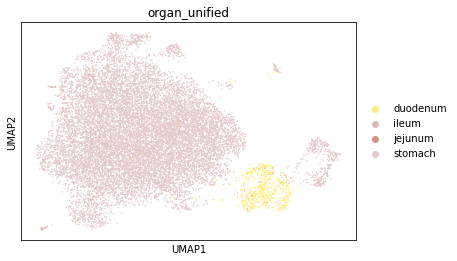

In [14]:
sc.pl.umap(full_muc5,color='organ_unified')

In [15]:
del full_muc5.uns['organ_unified_colors']

In [16]:
full_muc5

AnnData object with n_obs × n_vars = 15656 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

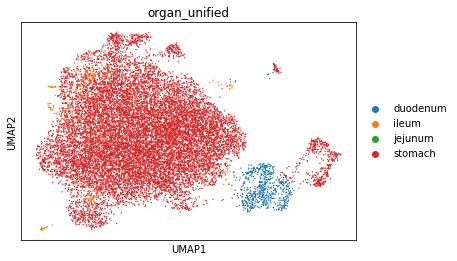

In [17]:
sc.pl.umap(full_muc5,color='organ_unified')

#### Plots by organ and disease

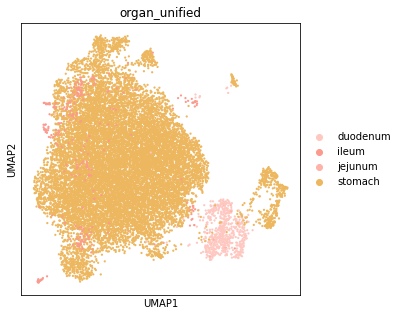

In [28]:
plt.rcParams['figure.figsize'] = [5, 5]
sc.pl.umap(full_muc5,color='organ_unified',palette={
  'stomach': '#edb75f',
  'duodenum': '#fec8c1',
  'jejunum': '#feb2a8',
  'ileum': '#fc9a8d'},size=20,save='SF_all_organ_unified.pdf')

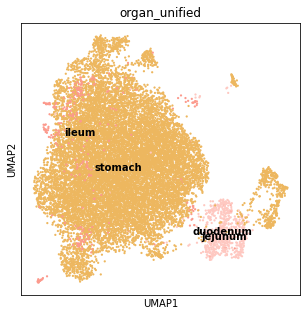

In [29]:
sc.pl.umap(full_muc5,color='organ_unified',palette={
  'stomach': '#edb75f',
  'duodenum': '#fec8c1',
  'jejunum': '#feb2a8',
  'ileum': '#fc9a8d'},size=20,legend_loc='on data')

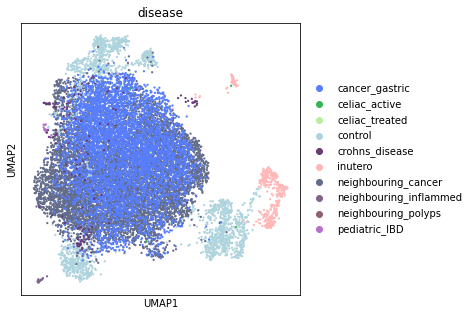

In [30]:
sc.pl.umap(full_muc5,color='disease',palette = {'control': '#ADD3DD',
  'inutero': '#ffb7b7',
  'cancer_gastric': '#577eff',
  'crohns_disease': '#693C78',
  'pediatric_IBD': '#B670CD',
  'ulcerative_colitis': '#8934B1',
  'cancer_colorectal': '#1131bf',
  'preterm': '#f48154',
  'celiac_active': '#38B257',
  'celiac_treated': '#b8ed9d',
    'neighbouring_cancer': '#636c8a',
  'neighbouring_polyps': '#8a6375',
  'neighbouring_inflammed': '#82638a'               },size=20,save='SF_all_disease.pdf')


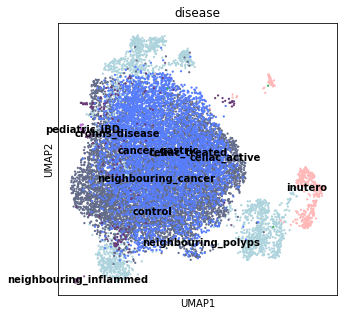

In [31]:
sc.pl.umap(full_muc5,color='disease',palette = {'control': '#ADD3DD',
  'inutero': '#ffb7b7',
  'cancer_gastric': '#577eff',
  'crohns_disease': '#693C78',
  'pediatric_IBD': '#B670CD',
  'ulcerative_colitis': '#8934B1',
  'cancer_colorectal': '#1131bf',
  'preterm': '#f48154',
  'celiac_active': '#38B257',
  'celiac_treated': '#b8ed9d',
    'neighbouring_cancer': '#636c8a',
  'neighbouring_polyps': '#8a6375',
  'neighbouring_inflammed': '#82638a'               },size=20,legend_loc='on data')


In [32]:
full_muc5.obs['organ_disease']= full_muc5.obs['organ_unified'].astype(str)+'_'+full_muc5.obs['disease'].astype(str)
full_muc5.obs.organ_disease.value_counts()

stomach_neighbouring_cancer     8048
stomach_cancer_gastric          5121
stomach_control                 1144
duodenum_control                 633
stomach_inutero                  394
ileum_crohns_disease             157
ileum_control                     91
ileum_neighbouring_inflammed      30
ileum_pediatric_IBD               14
jejunum_control                    8
duodenum_inutero                   7
duodenum_celiac_active             4
ileum_neighbouring_cancer          2
ileum_neighbouring_polyps          1
ileum_inutero                      1
duodenum_celiac_treated            1
Name: organ_disease, dtype: int64

In [33]:
full_muc5.obs['organ_disease'] = full_muc5.obs['organ_disease'].astype('category')

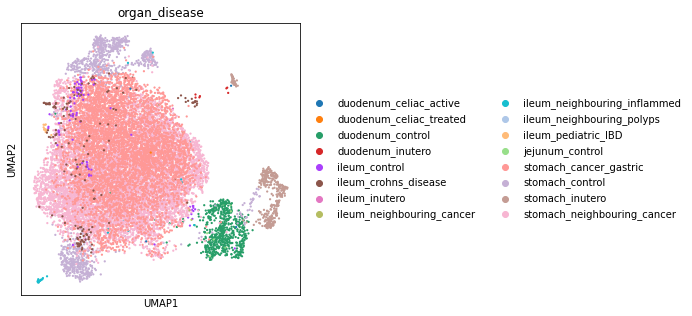

In [34]:
sc.pl.umap(full_muc5,color='organ_disease',size=20)

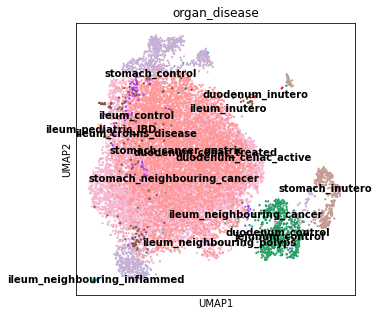

In [35]:
sc.pl.umap(full_muc5,color='organ_disease',size=20,legend_loc='on data')

In [36]:
import sctk as sk

In [37]:
full_muc5.obs.organ_disease.value_counts()

stomach_neighbouring_cancer     8048
stomach_cancer_gastric          5121
stomach_control                 1144
duodenum_control                 633
stomach_inutero                  394
ileum_crohns_disease             157
ileum_control                     91
ileum_neighbouring_inflammed      30
ileum_pediatric_IBD               14
jejunum_control                    8
duodenum_inutero                   7
duodenum_celiac_active             4
ileum_neighbouring_cancer          2
duodenum_celiac_treated            1
ileum_inutero                      1
ileum_neighbouring_polyps          1
Name: organ_disease, dtype: int64

In [38]:
#for plotting, remove categories with less than 2 cells
plot_full_muc5 = full_muc5[~full_muc5.obs.organ_disease.isin(['ileum_neighbouring_cancer',
'duodenum_celiac_treated',
'ileum_inutero',
'ileum_neighbouring_polyps'])].copy()

In [39]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=150,dpi_save=300)

In [40]:
plot_full_muc5.obs.organ_unified.value_counts()

stomach     14707
duodenum      644
ileum         292
jejunum         8
Name: organ_unified, dtype: int64

In [41]:
plot_full_muc5.obs.organ_disease.value_counts()

stomach_neighbouring_cancer     8048
stomach_cancer_gastric          5121
stomach_control                 1144
duodenum_control                 633
stomach_inutero                  394
ileum_crohns_disease             157
ileum_control                     91
ileum_neighbouring_inflammed      30
ileum_pediatric_IBD               14
jejunum_control                    8
duodenum_inutero                   7
duodenum_celiac_active             4
Name: organ_disease, dtype: int64

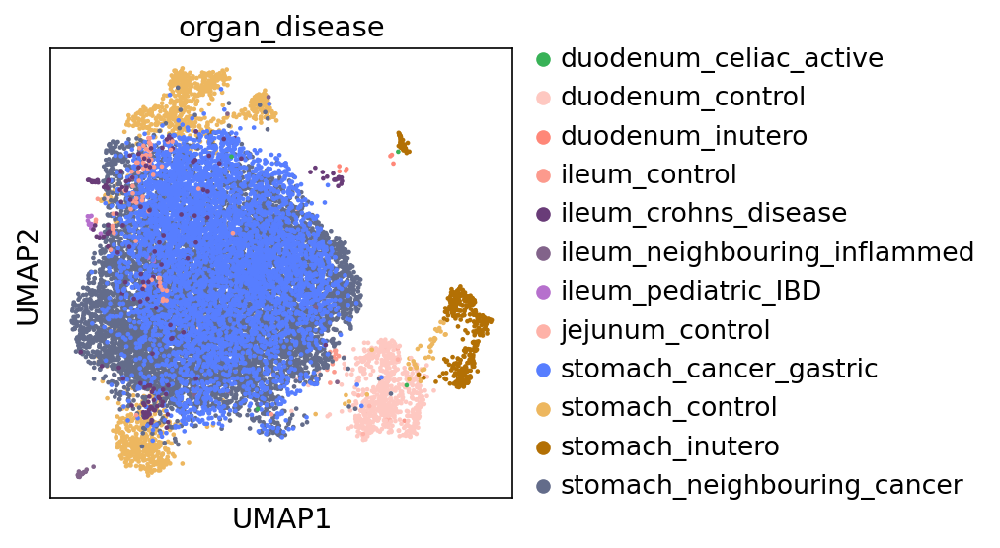

In [43]:
#plot by combination of organ and disease, as for MUC6 cells - Extended data 6d
sc.pl.umap(plot_full_muc5,color='organ_disease',size=20,palette={'duodenum_control': '#fec8c1',
           'stomach_control': '#edb75f',
  'duodenum_inutero': '#ff8778',
            'stomach_inutero': '#b37004',
  'stomach_cancer_gastric': '#577eff',
  'ileum_crohns_disease': '#693C78',
  'ileum_pediatric_IBD': '#B670CD',
  'jejunum_control': '#feb2a8',
            'ileum_control': '#fc9a8d',
 
  'duodenum_celiac_active': '#38B257',
  
    'stomach_neighbouring_cancer': '#636c8a',
  
  'ileum_neighbouring_inflammed': '#82638a'    } ,save='full_muc5_organdisease1.pdf'       )

#### Plot some marker genes

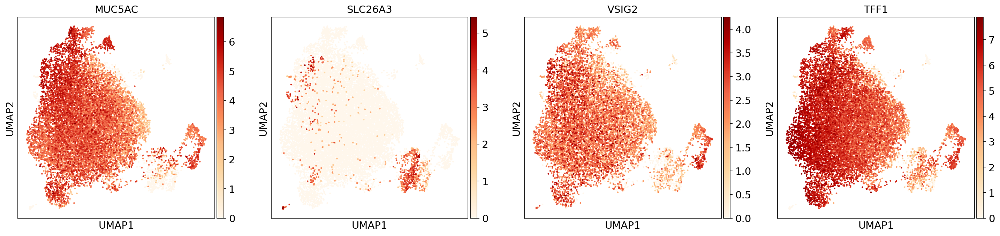

In [235]:
sc.pl.umap(plot_full_muc5,color=['MUC5AC','SLC26A3','VSIG2','TFF1'],size=20 ,save='full_muc5_markers.pdf',cmap='OrRd')

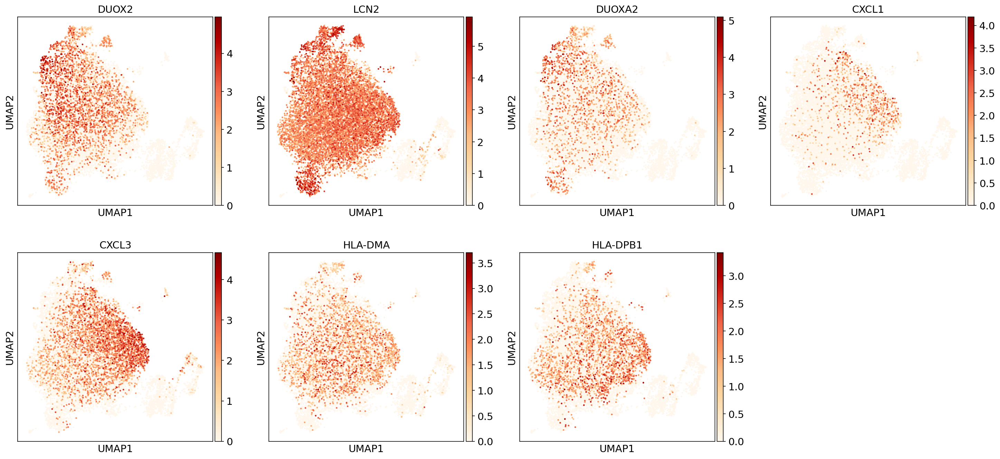

In [236]:
sc.pl.umap(plot_full_muc5,color=['DUOX2','LCN2','DUOXA2','CXCL1','CXCL3','HLA-DMA','HLA-DPB1'],size=20 ,save='full_muc5_markers_sto_ibd.pdf',cmap='OrRd')

#### Wilcoson DGE across organ/disease conditions

In [46]:
sc.tl.rank_genes_groups(plot_full_muc5,groupby='organ_disease',method='wilcoxon',key_added = "wilcoxon")

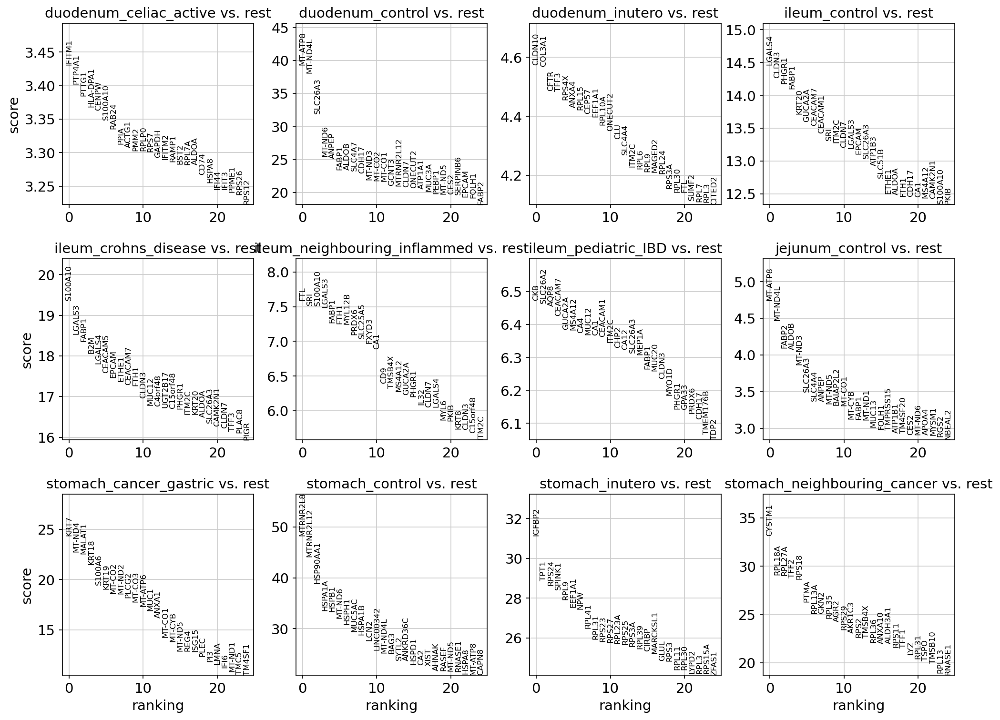

In [51]:
sc.pl.rank_genes_groups(plot_full_muc5, n_genes=25, sharey=False, key="wilcoxon")

In [53]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *

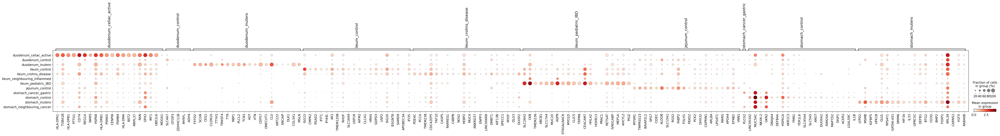

In [54]:
plot_full_muc5.raw = plot_full_muc5.copy()
mkst = calc_marker_stats(plot_full_muc5, groupby="organ_disease")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(plot_full_muc5, groupby='organ_disease', mks=mks,n_genes=20)

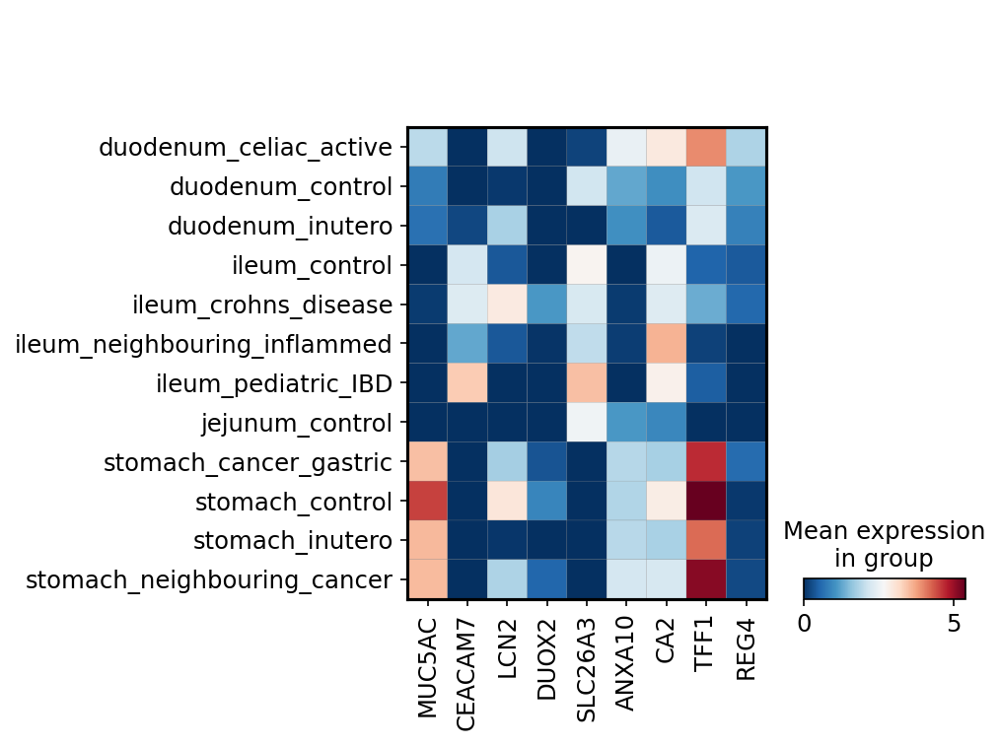

In [57]:
mp = sc.pl.matrixplot(plot_full_muc5,var_names=['MUC5AC','CEACAM7','LCN2','DUOX2','SLC26A3','ANXA10','CA2','TFF1','REG4'],groupby='organ_disease',cmap="RdBu_r",save = 'organ_disease_SFcells_incl_stomach_RdBucmap.pdf')

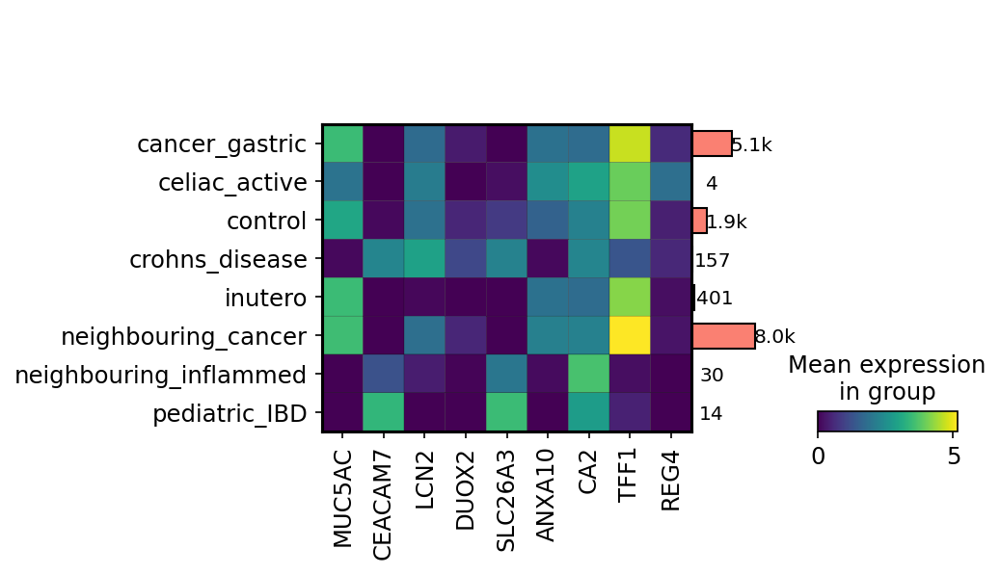

In [59]:
mp = sc.pl.matrixplot(plot_full_muc5,var_names=['MUC5AC','CEACAM7','LCN2','DUOX2','SLC26A3','ANXA10','CA2','TFF1','REG4'],groupby='disease',return_fig=True)
mp.add_totals().style(edge_color='black')
mp.savefig('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/figures/organdisease_SFcells_inclstomach_matrixplotaddtotals.pdf')

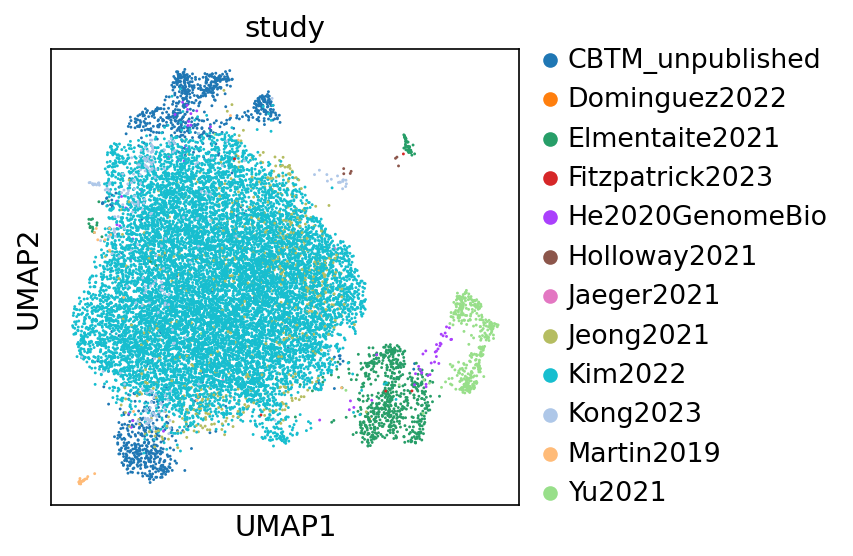

In [61]:
sc.pl.umap(plot_full_muc5,color='study',save='all_SF_bystudy.pdf')

In [62]:
#function for downsampling
def downsample_mask(clustering, to_thin, n_cells=200):
    mask = np.array([i not in to_thin for i in clustering])
    numtemp = np.arange(len(clustering))
    for clus in to_thin:
        inds = set(numtemp[[i==clus for i in clustering]])
        keep = random.sample(inds, round(n_cells))
        mask[keep] = True
    return mask

In [63]:
#Prepare categories for downsampling (per donor_celltype combination)
plot_full_muc5.obs['donor_celltype']=plot_full_muc5.obs['donorID_unified'].astype(str)+'_'+plot_full_muc5.obs['level_3_annot'].astype(str)
plot_full_muc5.obs.donor_celltype.value_counts()

D127_Surface_foveolar    1312
D115_Surface_foveolar    1205
D99_Surface_foveolar     1078
D124_Surface_foveolar     962
D131_Surface_foveolar     825
                         ... 
D44_Surface_foveolar        1
D4_Surface_foveolar         1
D28_Surface_foveolar        1
D160_Surface_foveolar       1
F18_Surface_foveolar        1
Name: donor_celltype, Length: 66, dtype: int64

### Downsampled muc5ac cells for marker gene analysis

In [64]:
#Downsample
vc=plot_full_muc5.obs.donor_celltype.value_counts().loc[lambda x: x>200].reset_index()['index']
mask_p = downsample_mask(plot_full_muc5.obs['donor_celltype'], vc.tolist(), n_cells=200)
muc5_downsample = plot_full_muc5[mask_p]
muc5_downsample.obs.donor_celltype.value_counts()

D99_Surface_foveolar     200
D121_Surface_foveolar    200
D112_Surface_foveolar    200
D115_Surface_foveolar    200
D116_Surface_foveolar    200
                        ... 
F18_Surface_foveolar       1
D4_Surface_foveolar        1
D44_Surface_foveolar       1
D160_Surface_foveolar      1
D157_Surface_foveolar      1
Name: donor_celltype, Length: 66, dtype: int64

         Falling back to preprocessing with `sc.pp.pca` and default params.


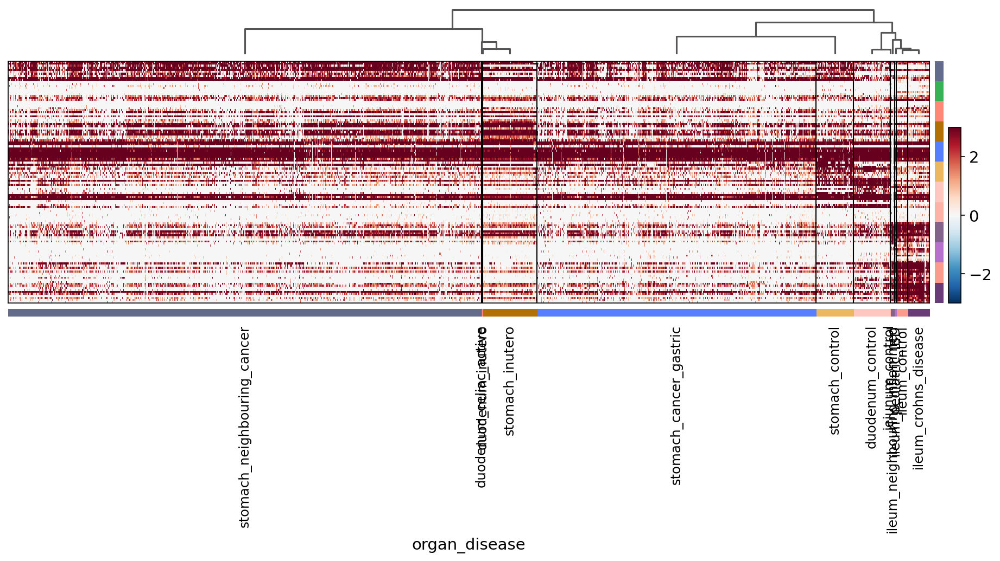

In [65]:
#dendrogram
sc.tl.rank_genes_groups(muc5_downsample,groupby='organ_disease',method='wilcoxon')
sc.tl.dendrogram(muc5_downsample, groupby='organ_disease')
sc.pl.rank_genes_groups_heatmap(muc5_downsample,groupby='organ_disease', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='RdBu_r',figsize=(15,5))

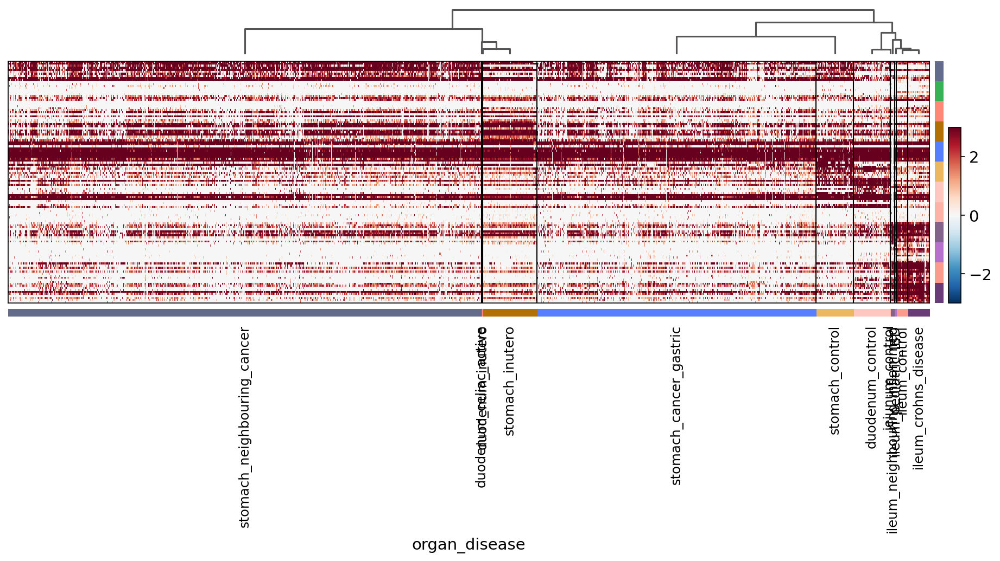

In [66]:
sc.pl.rank_genes_groups_heatmap(muc5_downsample,groupby='organ_disease', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='RdBu_r',figsize=(15,5),save='muc6_downsample_dendro.pdf')

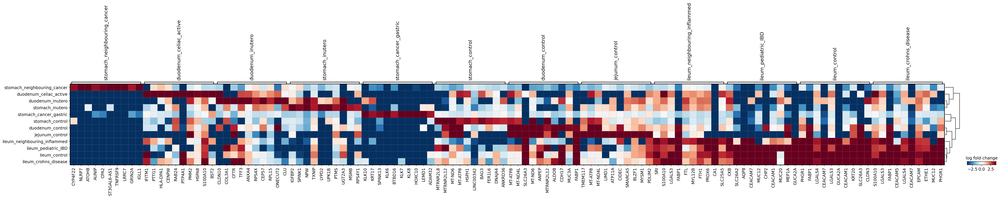

In [67]:
sc.pl.rank_genes_groups_matrixplot(
    muc5_downsample,
    n_genes=10,
    values_to_plot="logfoldchanges",
    cmap='RdBu_r',
    vmin=-4,
    vmax=4,
    min_logfoldchange=3,
    colorbar_title='log fold change',
)

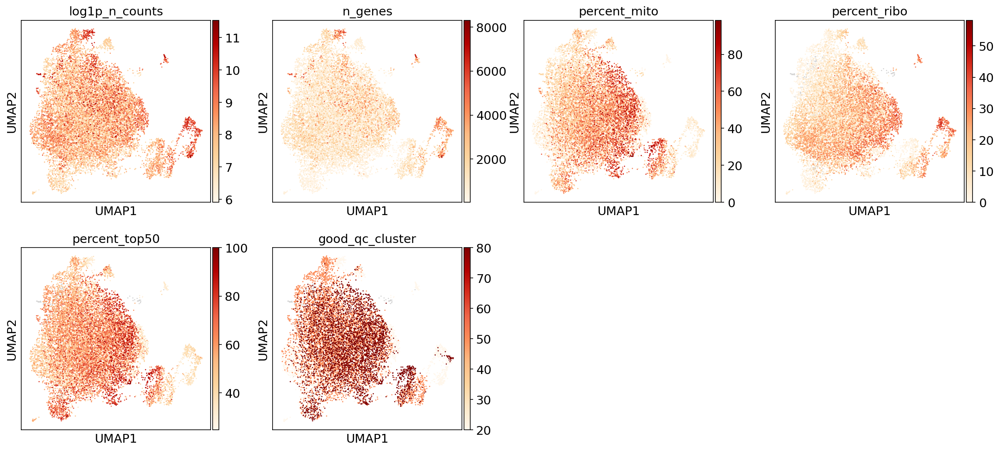

In [68]:
sc.pl.umap(plot_full_muc5,color=['log1p_n_counts','n_genes','percent_mito','percent_ribo','percent_top50','good_qc_cluster'],cmap='OrRd')

### SF comparison downsampled without MT/Ribo genes
remove mitochondrial and ribosomal genes before calculating differentially expressed genes

In [70]:
#remove technical artifacts from malat, mito and ribo genes from matrix
malat1 = full_adata.var_names.str.startswith('MALAT1')
mito_genes1 = full_adata.var_names.str.startswith('MT-')
mito_genes2 = full_adata.var_names.str.startswith('MTRNR')
ribo_genes1 = full_adata.var_names.str.startswith('RPL')
ribo_genes2 = full_adata.var_names.str.startswith('RPS')


remove = np.add(mito_genes1, mito_genes2)
remove = np.add(remove, ribo_genes1)
remove = np.add(remove, ribo_genes2)
remove = np.add(remove, malat1)
keep = np.invert(remove)

muc5_deg = muc5_downsample[:,keep]

print(muc5_deg.n_obs, muc5_deg.n_vars)

6700 18360


In [71]:
muc5_deg

View of AnnData object with n_obs × n_vars = 6700 × 18360
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts

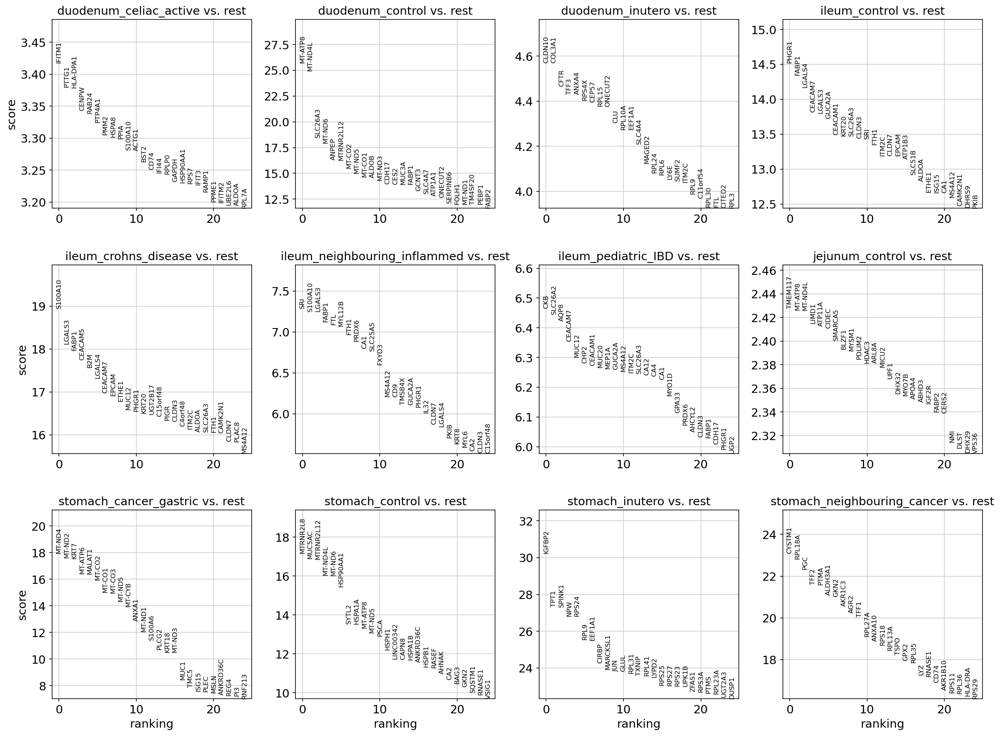

In [74]:
plt.rcParams['figure.figsize'] = [5,5]
sc.tl.rank_genes_groups(muc5_deg,groupby='organ_disease',method='wilcoxon')
sc.pl.rank_genes_groups(muc5_deg, n_genes=25, sharey=False)

In [75]:
sc.tl.rank_genes_groups(muc5_deg,groupby='organ_disease',method='wilcoxon')
sc.tl.dendrogram(muc5_deg, groupby='organ_disease')
sc.pl.rank_genes_groups_heatmap(muc6_deg,groupby='organ_disease', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=True,
                                vmin=-3, vmax=3, cmap='RdBu_r',figsize=(15,15),save='muc5_downsample_noMTorRPgenes_heatmap.pdf')

NameError: name 'muc6_deg' is not defined

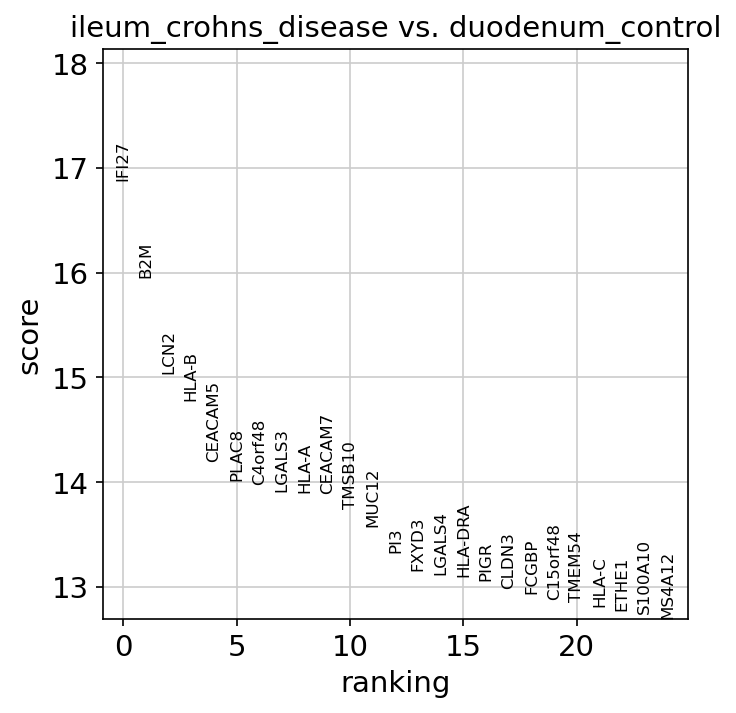

In [76]:
plt.rcParams['figure.figsize'] = [5,5]
sc.tl.rank_genes_groups(muc5_deg,groupby='organ_disease',groups=['ileum_crohns_disease'], reference='duodenum_control', method='wilcoxon',key_added = "wilcoxon")
sc.pl.rank_genes_groups(muc5_deg, n_genes=25, sharey=False, key="wilcoxon")

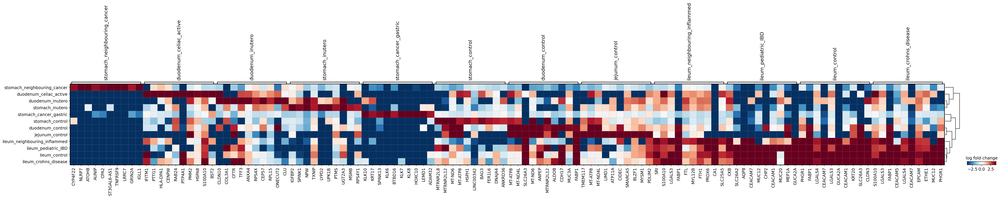

In [77]:
sc.pl.rank_genes_groups_matrixplot(
    muc5_deg,
    n_genes=10,
    values_to_plot="logfoldchanges",
    cmap='RdBu_r',
    vmin=-4,
    vmax=4,
    min_logfoldchange=3,
    colorbar_title='log fold change',
)

In [78]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(muc5_deg, group='ileum_crohns_disease', 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

2680


In [79]:
disease_vs_ileum = glist

In [80]:
disease_vs_duodenum = disease_vs_ileum

In [81]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2018'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

In [82]:
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=20,
              figsize=(3,12), 
              color=['red', 'blue','green'] # set colors for group
             )

NameError: name 'barplot' is not defined

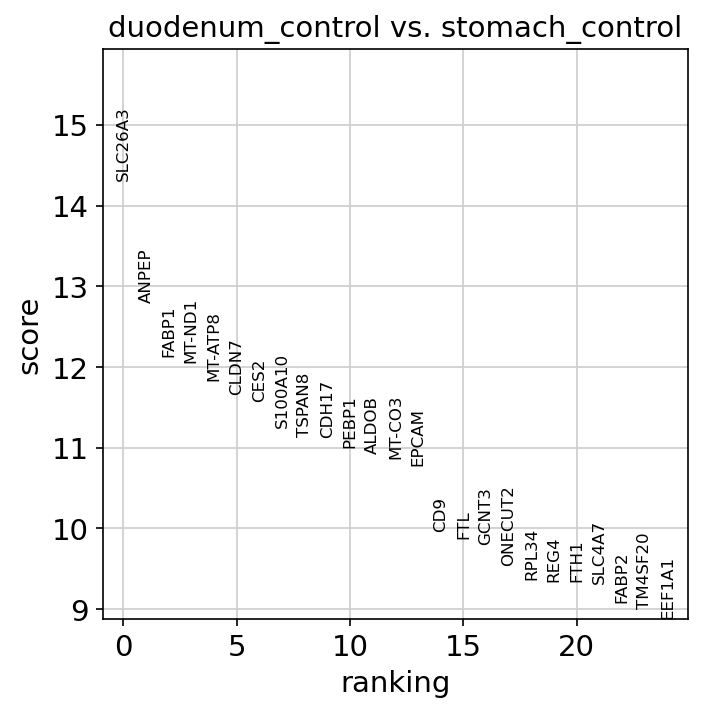

In [83]:
sc.tl.rank_genes_groups(muc5_deg,groupby='organ_disease',groups=['duodenum_control'], reference='stomach_control', method='wilcoxon')
sc.pl.rank_genes_groups(muc5_deg, n_genes=25, sharey=False)

In [84]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(muc5_deg, group='duodenum_control', 
                                     log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

268


In [85]:
stomach_vs_duodenum = glist

In [86]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2018'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

In [88]:
from gseapy import barplot, dotplot

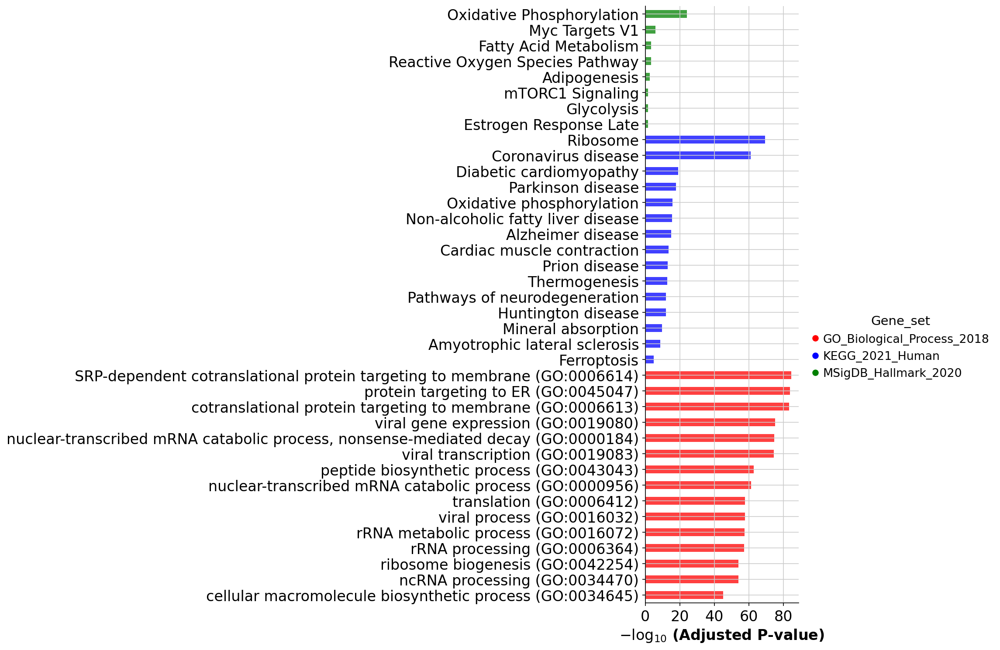

In [89]:
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=15,
              figsize=(3,12), 
              color=['red', 'blue','green'] # set colors for group
             )

### Now to find how many marker genes are overlapping between (1) ileum IBD SF-like cells, (2) healthy stomach SF cells and (3) healthy duodenum SF cells
- Calculate and export marker genes for 1, 2 and 3 compared to other epithelial cells across small intestine and stomach
- Then plot overlapping genes

In [90]:
epi = full_adata[full_adata.obs.level_1_annot.isin(['Epithelial'])].copy()

In [91]:
epi

AnnData object with n_obs × n_vars = 659483 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [92]:
epi.obs.organ_groups.unique()

array(['Oral_mucosa', 'Small_intestine', 'Stomach', 'Salivary_gland',
       'Large_intestine', 'Oesophagus'], dtype=object)

In [93]:
epi_organ = epi[epi.obs.organ_groups.isin(['Small_intestine', 'Stomach'])]

In [94]:
epi_organ

View of AnnData object with n_obs × n_vars = 344850 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_coun

In [95]:
epi_organ.obs['organ_disease'] = epi_organ.obs['organ_unified'].astype(str)+'_'+epi_organ.obs['disease'].astype(str)
epi_organ.obs.organ_disease.value_counts()

ileum_neighbouring_inflammed              103590
ileum_control                              50766
stomach_neighbouring_cancer                39783
stomach_cancer_gastric                     26252
ileum_crohns_disease                       24478
ileum_inutero                              23626
duodenum_inutero                           23555
duodenum_control                           12671
ileum_neighbouring_cancer                   8121
jejunum_control                             7456
ileum_pediatric_IBD                         5212
ileum_neighbouring_polyps                   4710
small intestine_control                     3254
small intestine_preterm                     2927
stomach_control                             2778
small intestine_inutero                     1594
stomach_inutero                             1277
jejunum_inutero                              898
duodenum_celiac_active                       896
duodenum_celiac_treated                      734
intestine_preterm   

In [96]:
epi_organ_age = epi_organ[~epi_organ.obs.disease.isin(['inutero','preterm'])].copy()

In [97]:
epi_organ_age.obs['organ_disease_celltype'] = epi_organ_age.obs['organ_disease'].astype(str)+'_'+epi_organ_age.obs['level_3_annot'].astype(str)
epi_organ_age.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte          53954
ileum_control_Enterocyte                         34776
ileum_neighbouring_inflammed_TA                  26391
stomach_neighbouring_cancer_Mucous_gland_neck    11669
stomach_neighbouring_cancer_Cycling              10019
                                                 ...  
MLN_control_Enterocyte                               1
jejunum_control_Paneth                               1
ileum_control_Mucous_gland_neck                      1
duodenum_celiac_treated_Mucous_gland_neck            1
duodenum_celiac_treated_Surface_foveolar             1
Name: organ_disease_celltype, Length: 181, dtype: int64

In [98]:
pd.set_option('display.max_rows', 500)
epi_organ_age.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte                     53954
ileum_control_Enterocyte                                    34776
ileum_neighbouring_inflammed_TA                             26391
stomach_neighbouring_cancer_Mucous_gland_neck               11669
stomach_neighbouring_cancer_Cycling                         10019
ileum_crohns_disease_Enterocyte                              9133
stomach_cancer_gastric_Cycling                               8659
duodenum_control_Enterocyte                                  8446
stomach_neighbouring_cancer_Surface_foveolar                 8048
ileum_crohns_disease_TA                                      7898
ileum_control_TA                                             7320
stomach_cancer_gastric_Mucous_gland_neck                     6136
ileum_neighbouring_inflammed_Goblet                          5832
jejunum_control_Enterocyte                                   5590
ileum_neighbouring_cancer_Enterocyte                         5454
stomach_ca

In [99]:
#remove SF cell combinations with 2 or less cells
epi_organ_age = epi_organ_age[~epi_organ_age.obs.organ_disease_celltype.isin([
    
'ileum_neighbouring_cancer_Surface_foveolar' ,
'ileum_neighbouring_polyps_Surface_foveolar',
'duodenum_celiac_treated_Surface_foveolar' ,
    ])].copy()

In [100]:
list(epi_organ_age.obs.organ_disease_celltype.unique())

['duodenum_control_TA',
 'ileum_control_TA',
 'ileum_control_Microfold',
 'ileum_control_Enterocyte',
 'ileum_control_Epithelial_stem',
 'stomach_control_Surface_foveolar',
 'stomach_control_Mucous_gland_neck',
 'stomach_control_Cycling',
 'stomach_control_Pareital',
 'stomach_control_Enteroendocrine_MX',
 'stomach_control_Enterochromaffin',
 'stomach_control_Chief',
 'stomach_control_Enteroendocrine_G',
 'stomach_control_Goblet_progenitor',
 'stomach_control_Goblet',
 'stomach_control_Enteroendocrine',
 'stomach_control_Enterocyte',
 'stomach_control_Enteroendocrine_X',
 'ileum_control_Goblet_cycling',
 'ileum_control_Goblet_progenitor',
 'ileum_control_BEST4_enterocyte_colonocyte',
 'ileum_control_Goblet',
 'ileum_control_Tuft',
 'ileum_control_Enteroendocrine',
 'ileum_control_Surface_foveolar',
 'ileum_control_Paneth',
 'duodenum_control_Enterocyte',
 'duodenum_control_BEST4_enterocyte_colonocyte',
 'duodenum_control_Epithelial_stem',
 'duodenum_control_Goblet_progenitor',
 'duoden

In [102]:
#remove other disease cell types so comapring MUC5 to healthy epithelial cells only
epi_organ_age = epi_organ_age[epi_organ_age.obs.organ_disease_celltype.isin(['duodenum_control_TA',
 'ileum_control_TA',
 'ileum_control_Microfold',
 'ileum_control_Enterocyte',
 'ileum_control_Epithelial_stem',
 'stomach_control_Surface_foveolar',
 'stomach_control_Mucous_gland_neck',
 'stomach_control_Cycling',
 'stomach_control_Pareital',
 'stomach_control_Enteroendocrine_MX',
 'stomach_control_Enterochromaffin',
 'stomach_control_Chief',
 'stomach_control_Enteroendocrine_G',
 'stomach_control_Goblet_progenitor',
 'stomach_control_Goblet',
 'stomach_control_Enteroendocrine',
 'stomach_control_Enterocyte',
 'stomach_control_Enteroendocrine_X',
 'ileum_control_Goblet_cycling',
 'ileum_control_Goblet_progenitor',
 'ileum_control_BEST4_enterocyte_colonocyte',
 'ileum_control_Goblet',
 'ileum_control_Tuft',
 'ileum_control_Enteroendocrine',
 'ileum_control_Surface_foveolar',
 'ileum_control_Paneth',
 'duodenum_control_Enterocyte',
 'duodenum_control_BEST4_enterocyte_colonocyte',
 'duodenum_control_Epithelial_stem',
 'duodenum_control_Goblet_progenitor',
 'duodenum_control_Goblet',
 'duodenum_control_Tuft',
 'ileum_neighbouring_polyps_TA',
 'ileum_neighbouring_polyps_Tuft',
 'ileum_neighbouring_polyps_Microfold',
 'ileum_neighbouring_polyps_Enteroendocrine',
 'ileum_neighbouring_polyps_Enterocyte',
 'ileum_neighbouring_polyps_BEST4_enterocyte_colonocyte',
 'ileum_neighbouring_polyps_Epithelial_stem',
 'ileum_neighbouring_polyps_Goblet_cycling',
 'ileum_neighbouring_polyps_Paneth',
 'ileum_neighbouring_polyps_Goblet_progenitor',
 'ileum_neighbouring_polyps_Goblet',
 'duodenum_control_Surface_foveolar',
 'duodenum_control_Goblet_cycling',
 'duodenum_control_Mucous_gland_neck',
 'duodenum_control_Enteroendocrine',
 'jejunum_control_TA',
 'jejunum_control_Enterocyte',
 'jejunum_control_BEST4_enterocyte_colonocyte',
 'jejunum_control_Epithelial_stem',
 'jejunum_control_Mucous_gland_neck',
 'jejunum_control_Goblet_cycling',
 'jejunum_control_Tuft',
 'jejunum_control_Surface_foveolar',
 'jejunum_control_Goblet',
 'ileum_control_Mucous_gland_neck',
 'duodenum_control_Microfold',
 'jejunum_control_Microfold',
 'jejunum_control_Goblet_progenitor',
 'jejunum_control_Enteroendocrine',
 'jejunum_control_Paneth',
 'MLN_control_Enterocyte',
 'MLN_control_TA',
 'small intestine_control_Enterocyte',
 'small intestine_control_BEST4_enterocyte_colonocyte',
 'small intestine_control_TA',
 'small intestine_control_Tuft',
 'small intestine_control_Enteroendocrine',
 'small intestine_control_Goblet_progenitor',
 'small intestine_control_Epithelial_stem',
 'small intestine_control_Goblet',
 'small intestine_control_Goblet_cycling',
 'ileum_neighbouring_inflammed_TA',
 'ileum_neighbouring_inflammed_Surface_foveolar',
 'ileum_neighbouring_inflammed_Enterocyte',
 'small intestine_neighbouring_inflammed_TA',
 'stomach_neighbouring_cancer_Surface_foveolar',
 'stomach_neighbouring_cancer_Pareital',
 'stomach_neighbouring_cancer_Cycling',
 'stomach_neighbouring_cancer_Mucous_gland_neck',
 'stomach_neighbouring_cancer_Chief',
 'stomach_neighbouring_cancer_Gastric_fetal_epithelial',
 'stomach_neighbouring_cancer_Enterocyte',
 'stomach_neighbouring_cancer_Enterochromaffin',
 'stomach_neighbouring_cancer_Goblet',
 'stomach_neighbouring_cancer_Enteroendocrine_X',
 'stomach_neighbouring_cancer_Enteroendocrine',
 'stomach_neighbouring_cancer_Enteroendocrine_MX',
 'stomach_neighbouring_cancer_BEST4_enterocyte_colonocyte',
 'stomach_neighbouring_cancer_Enteroendocrine_G',
 'stomach_neighbouring_cancer_Goblet_progenitor',
 'ileum_neighbouring_inflammed_Epithelial_stem',
 'ileum_neighbouring_inflammed_Goblet_progenitor',
 'ileum_neighbouring_inflammed_Enteroendocrine',
 'ileum_neighbouring_inflammed_Microfold',
 'ileum_neighbouring_inflammed_Goblet_cycling',
 'ileum_neighbouring_inflammed_Paneth',
 'ileum_neighbouring_inflammed_Goblet',
 'ileum_neighbouring_inflammed_BEST4_enterocyte_colonocyte',
 'ileum_neighbouring_inflammed_Tuft',
 'ileum_neighbouring_cancer_Enteroendocrine',
 'ileum_neighbouring_cancer_Enterocyte',
 'ileum_neighbouring_cancer_TA',
 'ileum_neighbouring_cancer_Goblet',
 'ileum_neighbouring_cancer_Tuft',
 'ileum_neighbouring_cancer_Goblet_cycling',
 'ileum_neighbouring_cancer_Goblet_progenitor',
 'ileum_neighbouring_cancer_Epithelial_stem',
 'ileum_neighbouring_cancer_Paneth',
 'ileum_neighbouring_cancer_BEST4_enterocyte_colonocyte',
 'duodenum_control_Paneth',
 'ileum_pediatric_IBD_Goblet_cycling',
 #'ileum_pediatric_IBD_TA',
 #'ileum_pediatric_IBD_Goblet_progenitor',
 #'ileum_pediatric_IBD_Enterocyte',
 #'ileum_pediatric_IBD_Epithelial_stem',
 #'ileum_pediatric_IBD_Enteroendocrine',
 #'ileum_pediatric_IBD_Microfold',
 #'ileum_pediatric_IBD_Goblet',
 #'ileum_pediatric_IBD_BEST4_enterocyte_colonocyte',
 #'ileum_pediatric_IBD_Tuft',
 #'ileum_pediatric_IBD_Paneth',
 #'ileum_pediatric_IBD_Mucous_gland_neck',
 'ileum_pediatric_IBD_Surface_foveolar',
 #'ileum_crohns_disease_TA',
 #'ileum_crohns_disease_Enterocyte',
 #'ileum_crohns_disease_Epithelial_stem',
 #'ileum_crohns_disease_Goblet',
 #'ileum_crohns_disease_Goblet_progenitor',
# 'ileum_crohns_disease_BEST4_enterocyte_colonocyte',
 #'ileum_crohns_disease_Tuft',
 #'ileum_crohns_disease_Enteroendocrine',
 #'ileum_crohns_disease_Goblet_cycling',
 #'ileum_crohns_disease_Paneth',
 #'ileum_crohns_disease_Mucous_gland_neck',
 'ileum_crohns_disease_Surface_foveolar',
 #'ileum_crohns_disease_Microfold',
 #'small intestine_crohns_disease_TA',
 #'stomach_cancer_gastric_Unknown',
 #'stomach_cancer_gastric_Mucous_gland_neck',
 'stomach_cancer_gastric_Surface_foveolar',
 #'stomach_cancer_gastric_Cycling',
 #'stomach_cancer_gastric_Chief',
 #'stomach_cancer_gastric_Goblet',
 #'stomach_cancer_gastric_Enterocyte',
 #'stomach_cancer_gastric_Enterochromaffin',
 #'stomach_cancer_gastric_Pareital',
 #'stomach_cancer_gastric_Enteroendocrine_MX',
 #'stomach_cancer_gastric_BEST4_enterocyte_colonocyte',
 #'stomach_cancer_gastric_Enteroendocrine_X',
 #'stomach_cancer_gastric_Goblet_progenitor',
 #'stomach_cancer_gastric_Enteroendocrine_G',
 #'stomach_cancer_gastric_Enteroendocrine',
 #'ileum_neighbouring_inflammed_Mucous_gland_neck',
 #'duodenum_celiac_active_Enterocyte',
 #'duodenum_celiac_active_Mucous_gland_neck',
 #'duodenum_celiac_active_TA',
 #'duodenum_celiac_active_Enteroendocrine',
 'duodenum_celiac_active_Surface_foveolar',
 #'duodenum_celiac_active_Tuft',
 #'duodenum_celiac_active_Goblet_cycling',
 #'duodenum_celiac_active_Goblet_progenitor',
 #'duodenum_celiac_active_Epithelial_stem',
 #'duodenum_celiac_active_Goblet',
 #'duodenum_celiac_active_BEST4_enterocyte_colonocyte',
 #'duodenum_celiac_active_Paneth',
 #'duodenum_celiac_treated_TA',
 #'duodenum_celiac_treated_Enterocyte',
 #'duodenum_celiac_treated_Enteroendocrine',
 #'duodenum_celiac_treated_Paneth',
 #'duodenum_celiac_treated_Tuft',
 #'duodenum_celiac_treated_Epithelial_stem',
 #'duodenum_celiac_treated_Goblet_cycling',
 #'duodenum_celiac_treated_Goblet_progenitor',
 #'duodenum_celiac_treated_BEST4_enterocyte_colonocyte',
 #'duodenum_celiac_treated_Goblet',
 #'duodenum_celiac_treated_Mucous_gland_neck'
                                                                            ])].copy()

In [103]:
#create organ specific datasets for SF cells (ie. remove SF cells from non-relevant organ/disease combinations)
stomach = epi_organ_age[~epi_organ_age.obs.organ_disease_celltype.isin(['ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
duodenum = epi_organ_age[~epi_organ_age.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
IBD = epi_organ_age[~epi_organ_age.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
celiac = epi_organ_age[~epi_organ_age.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', ])].copy()

In [104]:
stomach

AnnData object with n_obs × n_vars = 232593 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [105]:
stomach.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte                     53954
ileum_control_Enterocyte                                    34776
ileum_neighbouring_inflammed_TA                             26391
stomach_neighbouring_cancer_Mucous_gland_neck               11669
stomach_neighbouring_cancer_Cycling                         10019
duodenum_control_Enterocyte                                  8446
stomach_neighbouring_cancer_Surface_foveolar                 8048
ileum_control_TA                                             7320
ileum_neighbouring_inflammed_Goblet                          5832
jejunum_control_Enterocyte                                   5590
ileum_neighbouring_cancer_Enterocyte                         5454
ileum_neighbouring_inflammed_Goblet_progenitor               4555
stomach_neighbouring_cancer_Enterocyte                       3799
ileum_neighbouring_inflammed_Goblet_cycling                  3410
ileum_neighbouring_polyps_Enterocyte                         3215
ileum_neig

In [106]:
duodenum.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte                     53954
ileum_control_Enterocyte                                    34776
ileum_neighbouring_inflammed_TA                             26391
stomach_neighbouring_cancer_Mucous_gland_neck               11669
stomach_neighbouring_cancer_Cycling                         10019
duodenum_control_Enterocyte                                  8446
ileum_control_TA                                             7320
ileum_neighbouring_inflammed_Goblet                          5832
jejunum_control_Enterocyte                                   5590
ileum_neighbouring_cancer_Enterocyte                         5454
ileum_neighbouring_inflammed_Goblet_progenitor               4555
stomach_neighbouring_cancer_Enterocyte                       3799
ileum_neighbouring_inflammed_Goblet_cycling                  3410
ileum_neighbouring_polyps_Enterocyte                         3215
ileum_neighbouring_inflammed_Epithelial_stem                 2987
ileum_neig

In [107]:
IBD.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte                     53954
ileum_control_Enterocyte                                    34776
ileum_neighbouring_inflammed_TA                             26391
stomach_neighbouring_cancer_Mucous_gland_neck               11669
stomach_neighbouring_cancer_Cycling                         10019
duodenum_control_Enterocyte                                  8446
ileum_control_TA                                             7320
ileum_neighbouring_inflammed_Goblet                          5832
jejunum_control_Enterocyte                                   5590
ileum_neighbouring_cancer_Enterocyte                         5454
ileum_neighbouring_inflammed_Goblet_progenitor               4555
stomach_neighbouring_cancer_Enterocyte                       3799
ileum_neighbouring_inflammed_Goblet_cycling                  3410
ileum_neighbouring_polyps_Enterocyte                         3215
ileum_neighbouring_inflammed_Epithelial_stem                 2987
ileum_neig

In [108]:
IBD.obs.level_3_annot.value_counts()

Enterocyte                     117981
TA                              38816
Mucous_gland_neck               12310
Cycling                         10892
Goblet                           9123
Goblet_progenitor                6732
Goblet_cycling                   5556
Epithelial_stem                  5005
Paneth                           3720
BEST4_enterocyte_colonocyte      3045
Tuft                             2256
Chief                            2006
Enteroendocrine                  1986
Pareital                         1180
Enterochromaffin                  886
Enteroendocrine_MX                596
Enteroendocrine_X                 463
Microfold                         423
Enteroendocrine_G                 420
Surface_foveolar                  171
Gastric_fetal_epithelial            5
Name: level_3_annot, dtype: int64

In [109]:
celiac.obs.organ_disease_celltype.value_counts()

ileum_neighbouring_inflammed_Enterocyte                     53954
ileum_control_Enterocyte                                    34776
ileum_neighbouring_inflammed_TA                             26391
stomach_neighbouring_cancer_Mucous_gland_neck               11669
stomach_neighbouring_cancer_Cycling                         10019
duodenum_control_Enterocyte                                  8446
ileum_control_TA                                             7320
ileum_neighbouring_inflammed_Goblet                          5832
jejunum_control_Enterocyte                                   5590
ileum_neighbouring_cancer_Enterocyte                         5454
ileum_neighbouring_inflammed_Goblet_progenitor               4555
stomach_neighbouring_cancer_Enterocyte                       3799
ileum_neighbouring_inflammed_Goblet_cycling                  3410
ileum_neighbouring_polyps_Enterocyte                         3215
ileum_neighbouring_inflammed_Epithelial_stem                 2987
ileum_neig

#### Now we have 4 datasets, stomach, duodenum, IBD and celiac - where SF cells are only from that healthy organ/disease, and other cells are a healthy reference to identify common marker genes

In [110]:
#generate gene lists
sc.tl.rank_genes_groups(stomach,groupby='level_3_annot',method='wilcoxon')
sto = sc.get.rank_genes_groups_df(stomach, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(sto))

8340


In [111]:
sto

['MUC5AC',
 'TFF1',
 'S100P',
 'TFF2',
 'MUC1',
 'PSCA',
 'GKN2',
 'ANXA10',
 'CA2',
 'CLDN18',
 'LYZ',
 'VSIG2',
 'CTSE',
 'CYSTM1',
 'PGC',
 'AGR2',
 'LCN2',
 'RNASE1',
 'FCGBP',
 'VSIG1',
 'ALDH3A1',
 'SULT1C2',
 'FOXQ1',
 'GPX2',
 'NQO1',
 'CAPN8',
 'GSN',
 'CXCL17',
 'TESC',
 'KLF2',
 'TAGLN2',
 'SLPI',
 'TACSTD2',
 'AKR1B10',
 'STARD10',
 'MLPH',
 'ANKRD36C',
 'MSMB',
 'HSPB1',
 'BCAS1',
 'PLCG2',
 'CCND1',
 'CD59',
 'EPS8L1',
 'S100A11',
 'RAB27B',
 'ATP6V0C',
 'RNASE4',
 'TSPAN1',
 'DUOX2',
 'CAPG',
 'RPS17',
 'TMSB4X',
 'IL1R2',
 'PLA2G10',
 'TRNP1',
 'EEF1G',
 'NME2',
 'SOSTDC1',
 'GOLM1',
 'NKX6-2',
 'QSOX1',
 'SYTL2',
 'AKR1C1',
 'GALE',
 'MAL2',
 'AKR1C2',
 'OASL',
 'GALNT6',
 'IER3',
 'MIF',
 'IFI27',
 'ATP2A3',
 'LINC00342',
 'PSMB10',
 'LIPH',
 'LGALS9',
 'SFN',
 'CLIC3',
 'FXYD5',
 'AHNAK',
 'REP15',
 'CRIP1',
 'IL1RN',
 'TSPO',
 'TSTA3',
 'FXYD3',
 'ERN2',
 'CXCL3',
 'B4GALNT3',
 'SOX21',
 'KRT19',
 'CYP2S1',
 'SLC9A1',
 'GABARAP',
 'SDCBP',
 'TRAPPC5',
 'MECOM',
 'ET

In [112]:
#generate gene lists
sc.tl.rank_genes_groups(duodenum,groupby='level_3_annot',method='wilcoxon')
duo = sc.get.rank_genes_groups_df(duodenum, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(duo))

2092


In [113]:
duo

['MT-ATP8',
 'MT-ND4L',
 'SLC26A3',
 'CTSE',
 'TFF2',
 'ANXA10',
 'TFF1',
 'LYZ',
 'CAPN8',
 'HSPB1',
 'ONECUT2',
 'MT-ND5',
 'MT-CO2',
 'CA2',
 'MT-ND6',
 'GCNT3',
 'MLPH',
 'MT-CO1',
 'SLC4A7',
 'FOLH1',
 'GOLM1',
 'SULT1C2',
 'MT-ND3',
 'MSMB',
 'AKR1B10',
 'ABCC3',
 'MUC3A',
 'MTRNR2L12',
 'HPGD',
 'REG4',
 'AKR1C2',
 'PSCA',
 'MT-ND1',
 'C6orf141',
 'FOXQ1',
 'MUC1',
 'TMPRSS15',
 'SLC25A37',
 'SERPINB6',
 'AL627171.2',
 'S100A6',
 'VSIG2',
 'AK4',
 'AHNAK',
 'LPCAT4',
 'C12orf75',
 'DNM2',
 'NME2',
 'NEAT1',
 'ABCC5',
 'MT-ATP6',
 'RGS2',
 'CYSTM1',
 'MT-ND4',
 'TM4SF1',
 'RNASEK',
 'ATP6V0C',
 'S100P',
 'MT-CO3',
 'SLC4A4',
 'MEIS2',
 'MT-CYB',
 'MUC5AC',
 'PLA2G10',
 'TRIM31',
 'GABARAP',
 'HSPA1A',
 'AKR1C1',
 'PIM3',
 'SRRM2',
 'CRIP1',
 'MYO15B',
 'VMP1',
 'NDUFA7',
 'GSN',
 'BAIAP2L1',
 'GALNT4',
 'OSBPL7',
 'FHL2',
 'HSPG2',
 'NBEAL2',
 'CD59',
 'NQO1',
 'PLEC',
 'FXYD3',
 'CYP2C18',
 'SLC44A4',
 'EEF1G',
 'FLNB',
 'TSPAN1',
 'LPIN2',
 'ZDHHC11B',
 'GALNT6',
 'KCNE3',
 'FB

In [114]:
#generate gene lists
sc.tl.rank_genes_groups(IBD,groupby='level_3_annot',method='wilcoxon')
ibd = sc.get.rank_genes_groups_df(IBD, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(ibd))

3705


In [115]:
ibd

['CEACAM5',
 'CA2',
 'CEACAM7',
 'IFI27',
 'FXYD3',
 'PLAC8',
 'S100A6',
 'TSPAN1',
 'MUC12',
 'PI3',
 'MS4A12',
 'TMEM54',
 'CA1',
 'MUC1',
 'CEACAM6',
 'S100A10',
 'SLC26A3',
 'SH3BGRL3',
 'S100P',
 'ETHE1',
 'PIGR',
 'FCGBP',
 'ITM2C',
 'LCN2',
 'SMIM22',
 'C19orf33',
 'LGALS3',
 'C15orf48',
 'UGP2',
 'FABP1',
 'CD9',
 'KRT20',
 'B2M',
 'CTSS',
 'CEACAM1',
 'PKIB',
 'PHGR1',
 'CSTB',
 'SLPI',
 'PLA2G10',
 'TSPAN8',
 'CCL28',
 'C4orf48',
 'HSPB1',
 'RHOC',
 'TST',
 'ASS1',
 'HIGD1A',
 'CD59',
 'LGALS4',
 'MYL12B',
 'PRDX6',
 'HK2',
 'VSIG2',
 'LYPD8',
 'CA4',
 'KTN1',
 'H2AFJ',
 'PPDPF',
 'CD63',
 'SELENBP1',
 'ACAA2',
 'UQCRQ',
 'NQO1',
 'ALDOA',
 'KRT19',
 'MYL6',
 'EMP1',
 'GPT',
 'CLDN7',
 'SLC44A4',
 'MGLL',
 'KRT8',
 'CLTB',
 'CIB1',
 'ACTB',
 'HLA-E',
 'SRI',
 'CAP1',
 'PLS1',
 'OAS1',
 'CAST',
 'NDUFA1',
 'GIPC1',
 'HLA-B',
 'MISP',
 'CST3',
 'PDZK1IP1',
 'CYSTM1',
 'AK1',
 'TMSB4X',
 'HPGD',
 'CA12',
 'DHRS9',
 'SCNN1A',
 'C10orf99',
 'BSG',
 'FLNB',
 'SULT1B1',
 'SLC26A2',


In [116]:
#generate gene lists
sc.tl.rank_genes_groups(celiac,groupby='level_3_annot',method='wilcoxon')
ced = sc.get.rank_genes_groups_df(celiac, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(ced))

0


In [117]:
ced

[]

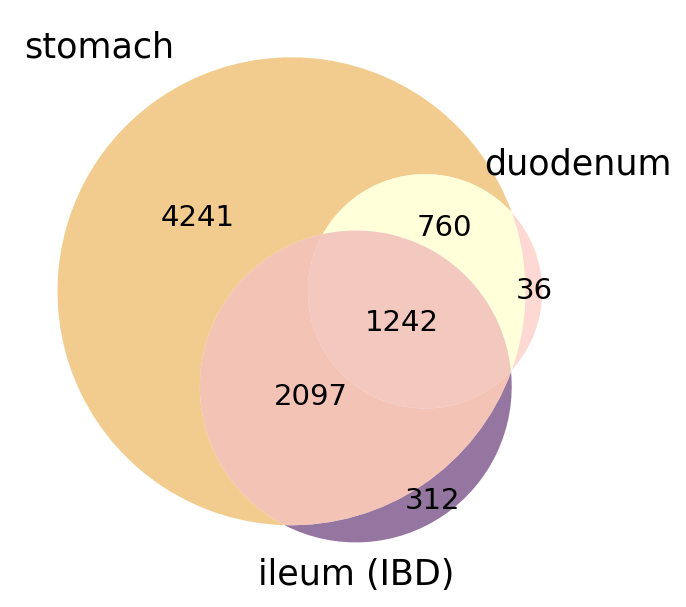

In [118]:
from matplotlib_venn import venn3
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn3([set1, set2, set3], ('stomach', 'duodenum', 'ileum (IBD)'),set_colors=('#edb75f', '#fec8c1','#693C78'), alpha = 0.7)
plt.savefig('venn_MUC5_markers_test1.pdf')

plt.show()

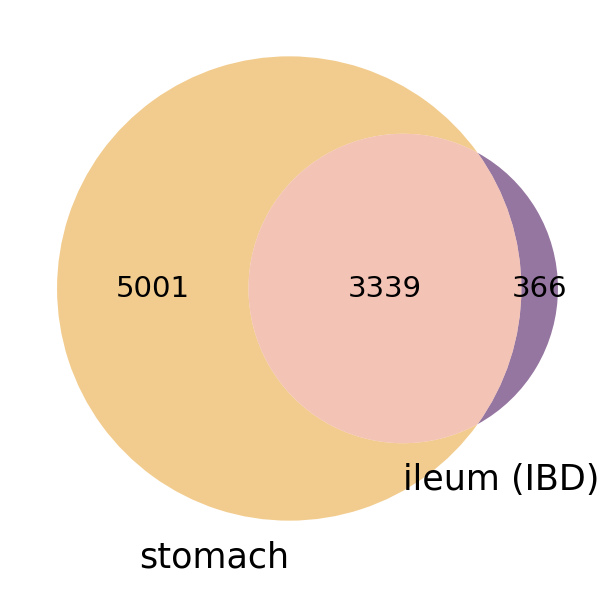

In [119]:
from matplotlib_venn import venn2
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn2([set1, set3], ('stomach', 'ileum (IBD)'),set_colors=('#edb75f', '#693C78'), alpha = 0.7)

plt.show()

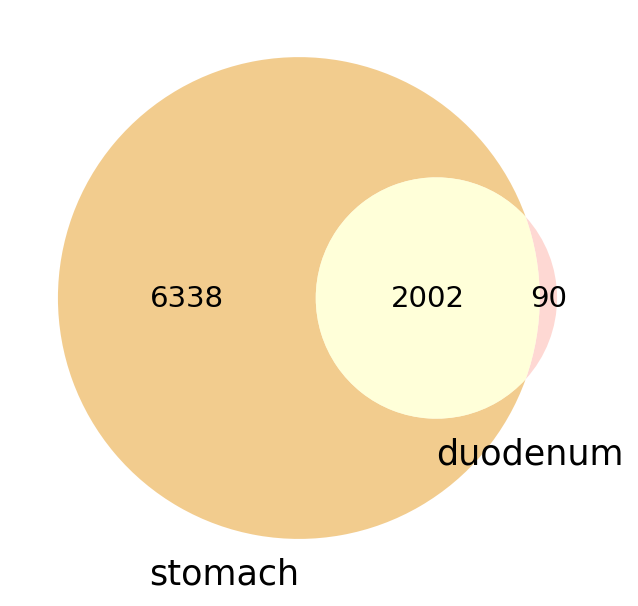

In [120]:
from matplotlib_venn import venn2
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn2([set1, set2], ('stomach', 'duodenum'),set_colors=('#edb75f','#fec8c1'), alpha = 0.7)

plt.show()

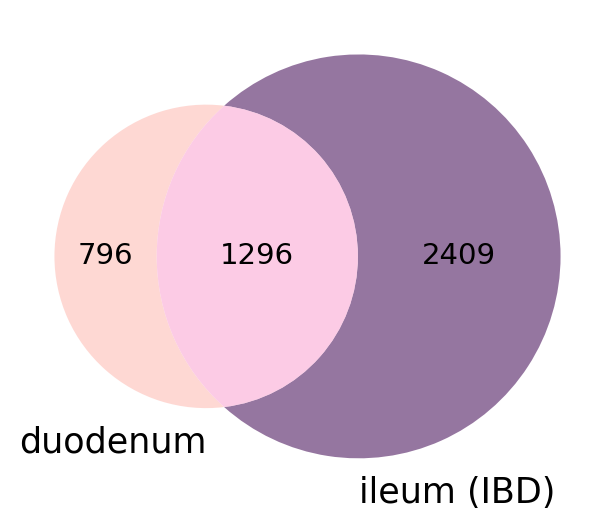

In [121]:
from matplotlib_venn import venn2
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn2([ set2,set3], ('duodenum','ileum (IBD)'),set_colors=('#fec8c1', '#693C78'), alpha = 0.7)

plt.show()

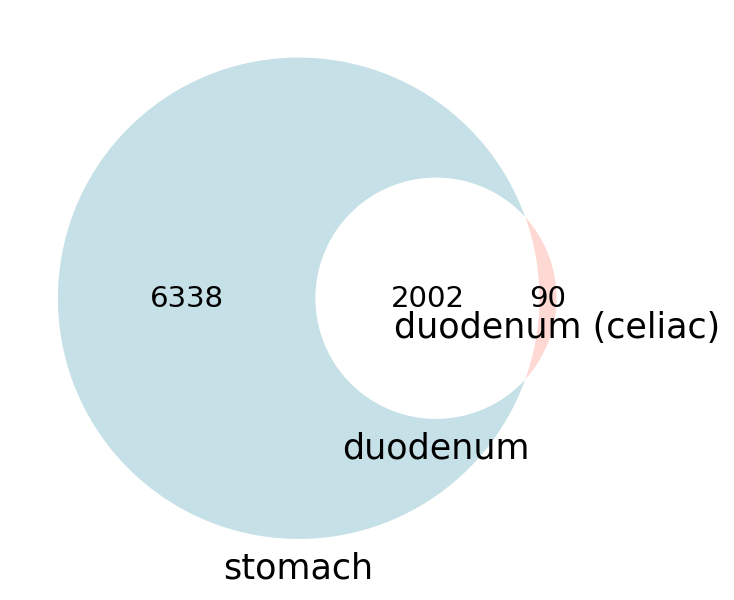

In [122]:
from matplotlib_venn import venn3
set1 = set(sto)
set2 = set(duo)
set4 = set(ced)

venn3([set1, set2, set4], ('stomach', 'duodenum', 'duodenum (celiac)'),set_colors=('#ADD3DD', '#fec8c1','#38B257'), alpha = 0.7)
plt.savefig('venn_MUC6_markers_test2.pdf')

plt.show()

In [123]:
sto = pd.DataFrame(sto, columns=['gene_list'])
duo = pd.DataFrame(duo, columns=['gene_list'])
ibd = pd.DataFrame(ibd, columns=['gene_list'])
ced = pd.DataFrame(ced, columns=['gene_list'])

sto.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysissto_SFmakers.csv')
duo.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/duo_SFmakers.csv')
ibd.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysisibd_SFmakers.csv')
ced.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/ced_SFmakers.csv')

#### Repeat but with downsampled per cell type per donor

In [124]:
#Prepare categories for downsampling (per donor_celltype combination)
epi_organ_age.obs['donor_celltype']=epi_organ_age.obs['donorID_unified'].astype(str)+'_'+epi_organ_age.obs['level_3_annot'].astype(str)
epi_organ_age.obs.donor_celltype.value_counts()

D207_Enterocyte                    22733
D207_TA                             9010
D168_Enterocyte                     8924
D11_Enterocyte                      6846
D216_Enterocyte                     5946
                                   ...  
D131_Goblet                            1
D10_BEST4_enterocyte_colonocyte        1
D131_Gastric_fetal_epithelial          1
D106_Enterochromaffin                  1
D117_Enteroendocrine_G                 1
Name: donor_celltype, Length: 1108, dtype: int64

In [125]:
epi_organ_age

AnnData object with n_obs × n_vars = 238651 × 18485
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

In [126]:
#function for downsampling
def downsample_mask(clustering, to_thin, n_cells=200):
    mask = np.array([i not in to_thin for i in clustering])
    numtemp = np.arange(len(clustering))
    for clus in to_thin:
        inds = set(numtemp[[i==clus for i in clustering]])
        keep = random.sample(inds, round(n_cells))
        mask[keep] = True
    return mask

In [127]:
#Downsample
vc=epi_organ_age.obs.donor_celltype.value_counts().loc[lambda x: x>100].reset_index()['index']
mask_p = downsample_mask(epi_organ_age.obs['donor_celltype'], vc.tolist(), n_cells=100)
epi_organ_age_downsample = epi_organ_age[mask_p]
epi_organ_age_downsample.obs.donor_celltype.value_counts()

D207_Goblet_cycling                100
D210_Enterocyte                    100
D210_Goblet                        100
D188_Enterocyte                    100
D129_Mucous_gland_neck             100
                                  ... 
D131_Goblet                          1
D10_BEST4_enterocyte_colonocyte      1
D131_Gastric_fetal_epithelial        1
D106_Enterochromaffin                1
D117_Enteroendocrine_G               1
Name: donor_celltype, Length: 1108, dtype: int64

In [128]:
stomach = epi_organ_age_downsample[~epi_organ_age_downsample.obs.organ_disease_celltype.isin(['ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
duodenum = epi_organ_age_downsample[~epi_organ_age_downsample.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
IBD = epi_organ_age_downsample[~epi_organ_age_downsample.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', 'duodenum_celiac_active_Surface_foveolar',])].copy()
celiac = epi_organ_age_downsample[~epi_organ_age_downsample.obs.organ_disease_celltype.isin([ 'stomach_control_Surface_foveolar', 'ileum_control_Surface_foveolar', 'duodenum_control_Surface_foveolar', 
    'jejunum_control_Surface_foveolar', 'ileum_neighbouring_inflammed_Surface_foveolar', 
    'stomach_neighbouring_cancer_Surface_foveolar', 'ileum_pediatric_IBD_Surface_foveolar', 
    'ileum_crohns_disease_Surface_foveolar', 'stomach_cancer_gastric_Surface_foveolar', ])].copy()

In [129]:
#generate gene lists
sc.tl.rank_genes_groups(stomach,groupby='level_3_annot',method='wilcoxon')
sto = sc.get.rank_genes_groups_df(stomach, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(sto))

7504


In [130]:
sto

['MUC5AC',
 'TFF1',
 'S100P',
 'TFF2',
 'PSCA',
 'CA2',
 'MUC1',
 'ANXA10',
 'GKN2',
 'CLDN18',
 'VSIG2',
 'CTSE',
 'LYZ',
 'CYSTM1',
 'ALDH3A1',
 'AKR1B10',
 'PGC',
 'SULT1C2',
 'NQO1',
 'VSIG1',
 'FOXQ1',
 'LCN2',
 'CXCL17',
 'TESC',
 'RNASE1',
 'SLPI',
 'CAPN8',
 'KLF2',
 'TAGLN2',
 'AGR2',
 'TMSB4X',
 'CRIP1',
 'TACSTD2',
 'IFI27',
 'MSMB',
 'GPX2',
 'KRT19',
 'S100A11',
 'C19orf33',
 'CAPG',
 'NME2',
 'CD59',
 'TSPAN1',
 'BLVRB',
 'SOSTDC1',
 'RPS17',
 'IL1R2',
 'PLA2G10',
 'GSN',
 'RNASE4',
 'ATP6V0C',
 'CCND1',
 'AKR1C1',
 'TRNP1',
 'LINC01133',
 'AKR1C3',
 'CLIC3',
 'FXYD3',
 'SFN',
 'AHNAK',
 'TSPO',
 'HSPB1',
 'RAB27B',
 'MAL2',
 'GOLM1',
 'FXYD5',
 'NKX6-2',
 'AKR1C2',
 'TAX1BP3',
 'ANKRD36C',
 'DUOX2',
 'EEF1G',
 'CA9',
 'MLPH',
 'GALE',
 'EPS8L1',
 'SOX21',
 'IL1RN',
 'MIF',
 'SLC9A1',
 'SPINK1',
 'CXCL3',
 'GALNT6',
 'CSTA',
 'CSTB',
 'CYP2S1',
 'OASL',
 'SPTSSB',
 'BPIFB1',
 'FABP5',
 'NDUFB8',
 'NDUFA7',
 'PSMB10',
 'GSTP1',
 'FCGBP',
 'PLAC8',
 'LAMB3',
 'LIME1',
 'SLC

In [131]:
#generate gene lists
sc.tl.rank_genes_groups(duodenum,groupby='level_3_annot',method='wilcoxon')
duo = sc.get.rank_genes_groups_df(duodenum, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(duo))

1668


In [132]:
duo

['MT-ATP8',
 'MT-ND4L',
 'SLC26A3',
 'CTSE',
 'ANXA10',
 'MT-ND6',
 'TFF2',
 'GCNT3',
 'CA2',
 'HPGD',
 'LYZ',
 'TFF1',
 'FOLH1',
 'CAPN8',
 'AKR1B10',
 'ONECUT2',
 'MUC3A',
 'AKR1C2',
 'SULT1C2',
 'MTRNR2L12',
 'TMPRSS15',
 'MSMB',
 'GOLM1',
 'SLC4A7',
 'PSCA',
 'TM4SF20',
 'MT-ND5',
 'HSPB1',
 'AHNAK',
 'C6orf141',
 'VSIG2',
 'CYP2C18',
 'MT-CO2',
 'ABCC3',
 'MLPH',
 'SLC25A37',
 'TSPAN8',
 'AKR1C1',
 'ANPEP',
 'AL627171.2',
 'CES2',
 'SGK1',
 'CYSTM1',
 'SLC4A4',
 'AK4',
 'SERPINB6',
 'GPRC5A',
 'RGS2',
 'HSD17B2',
 'REG4',
 'TRIM31',
 'MT-CO1',
 'FOXQ1',
 'PLA2G10',
 'IQGAP2',
 'GALNT6',
 'MALL',
 'TM4SF1',
 'SLC46A1',
 'NDUFA7',
 'CDHR2',
 'OSBPL7',
 'CYP2C9',
 'CYP2C19',
 'RNF130',
 'WDR74',
 'GUCA2B',
 'SURF6',
 'TSR3',
 'CDC42SE2',
 'THYN1',
 'NFU1',
 'SCOC',
 'DHPS',
 'MKKS',
 'FUT6',
 'CLU',
 'STXBP6',
 'CTSB',
 'MGAT1',
 'MPZL1',
 'SNRPA1',
 'MRPL13',
 'RPS7',
 'ZNF24',
 'UBE2N',
 'EIF2S3',
 'TADA3',
 'RAB21',
 'CDC42EP4',
 'ACTG1',
 'MAGED1',
 'PTMS',
 'UFL1',
 'PHKB',
 'MA

In [133]:
#generate gene lists
sc.tl.rank_genes_groups(IBD,groupby='level_3_annot',method='wilcoxon')
ibd = sc.get.rank_genes_groups_df(IBD, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(ibd))

2983


In [134]:
ibd

['CEACAM5',
 'IFI27',
 'CEACAM7',
 'CA2',
 'PLAC8',
 'MUC12',
 'SLC26A3',
 'TSPAN1',
 'S100A6',
 'PI3',
 'FXYD3',
 'MS4A12',
 'FABP1',
 'TMEM54',
 'CA1',
 'S100A10',
 'CEACAM6',
 'C15orf48',
 'C19orf33',
 'PHGR1',
 'LGALS3',
 'ETHE1',
 'PIGR',
 'CEACAM1',
 'RHOC',
 'MUC1',
 'LCN2',
 'S100P',
 'UGP2',
 'KRT20',
 'PKIB',
 'ASS1',
 'SMIM22',
 'TSPAN8',
 'ITM2C',
 'B2M',
 'SLPI',
 'SH3BGRL3',
 'CCL28',
 'CTSS',
 'MYL12B',
 'PLS1',
 'CSTB',
 'SULT1B1',
 'HIGD1A',
 'EMP1',
 'LINC01133',
 'GPT',
 'MISP',
 'PLA2G10',
 'KRT19',
 'CA4',
 'TST',
 'C4orf48',
 'CDA',
 'LYPD8',
 'PPP1R14D',
 'PRDX6',
 'ACAA2',
 'HPGD',
 'UQCRQ',
 'ALDOA',
 'HK2',
 'UGT2B17',
 'GCNT3',
 'SLC26A2',
 'MALL',
 'AOC1',
 'SELENBP1',
 'CLTB',
 'SRI',
 'CLDN7',
 'ACTB',
 'H2AFJ',
 'C2orf88',
 'CD9',
 'C10orf99',
 'VSIG2',
 'VAMP8',
 'OAS1',
 'CD59',
 'LGALS4',
 'CTSD',
 'CIB1',
 'PRR13',
 'HSPB1',
 'NQO1',
 'FLNB',
 'DHRS9',
 'SLC44A4',
 'AK1',
 'DUOX2',
 'FTH1',
 'MYL6',
 'GPA33',
 'KTN1',
 'IL18',
 'CST3',
 'TRIM31',
 'SD

In [135]:
#generate gene lists
sc.tl.rank_genes_groups(celiac,groupby='level_3_annot',method='wilcoxon')
ced = sc.get.rank_genes_groups_df(celiac, group='Surface_foveolar',  
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(ced))

0


In [136]:
ced

[]

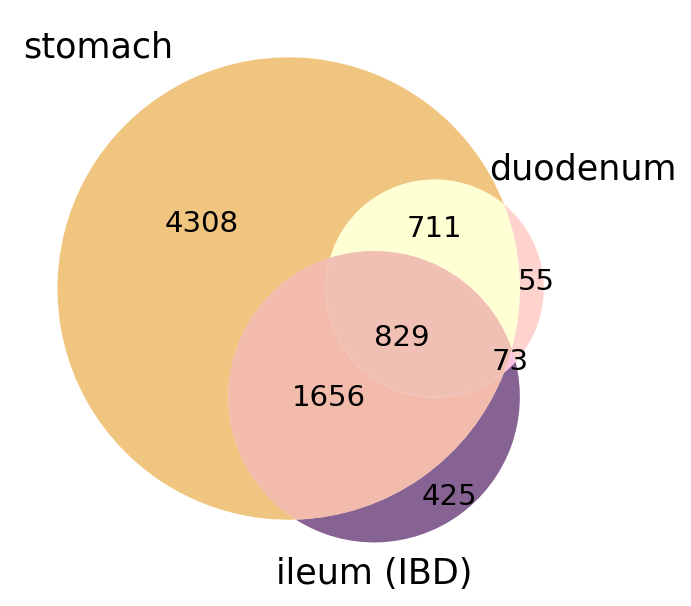

In [137]:
from matplotlib_venn import venn3
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn3([set1, set2, set3], ('stomach', 'duodenum', 'ileum (IBD)'),set_colors=('#edb75f', '#fec8c1','#693C78'), alpha = 0.8)
plt.savefig('venn_MUC5_markers_test1.pdf')

plt.show()

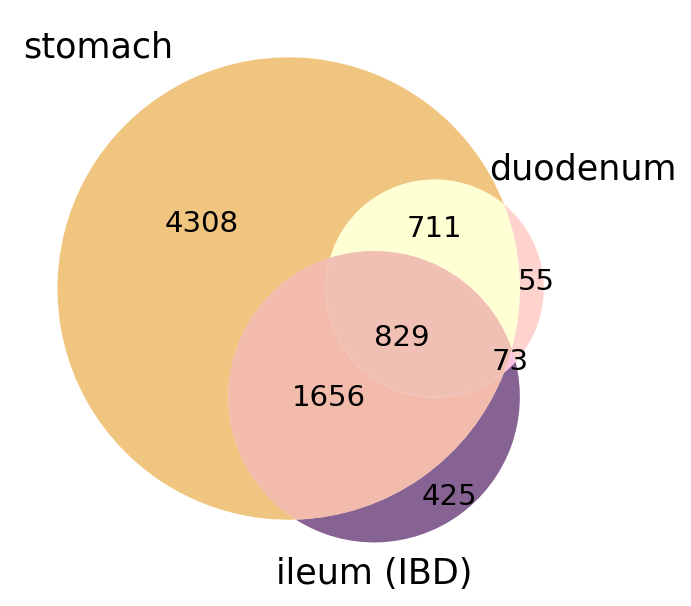

In [138]:
from matplotlib_venn import venn3
set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)

venn3([set1, set2, set3], ('stomach', 'duodenum', 'ileum (IBD)'),set_colors=('#edb75f', '#fec8c1','#693C78'), alpha = 0.8)
plt.savefig('venn_MUC5_markers_test1.png')

plt.show()

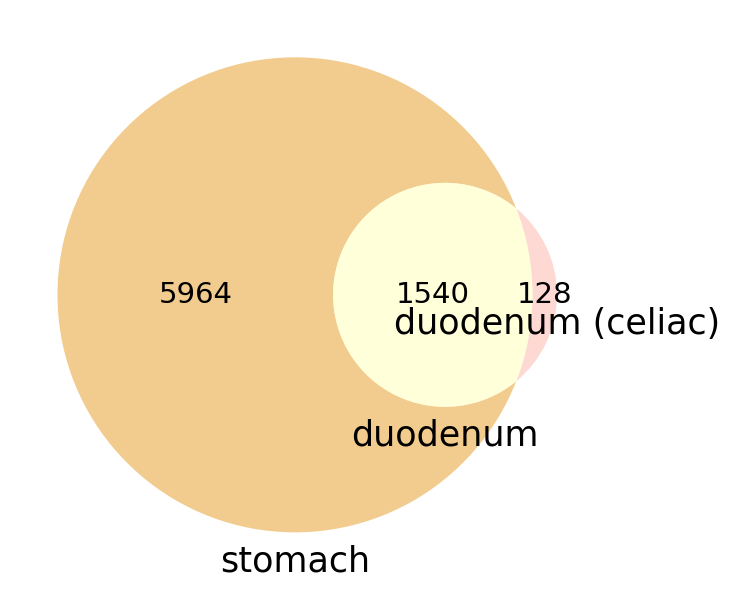

In [139]:
from matplotlib_venn import venn3
set1 = set(sto)
set2 = set(duo)
set4 = set(ced)

venn3([set1, set2, set4], ('stomach', 'duodenum', 'duodenum (celiac)'),set_colors=('#edb75f', '#fec8c1','#38B257'), alpha = 0.7)
plt.savefig('venn_MUC5_markers_test_downsampled.pdf')

plt.show()

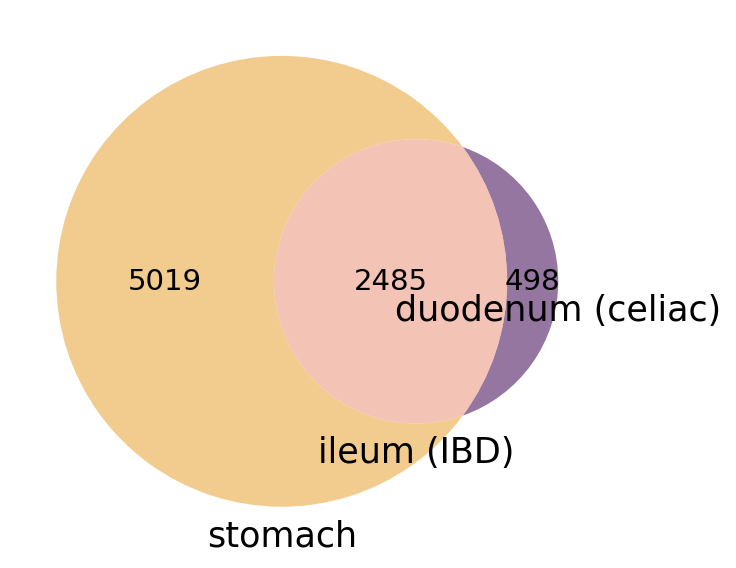

In [140]:
from matplotlib_venn import venn3
set1 = set(sto)
set3 = set(ibd)
set4 = set(ced)

venn3([set1, set3, set4], ('stomach', 'ileum (IBD)', 'duodenum (celiac)'),set_colors=('#edb75f', '#693C78','#38B257'), alpha = 0.7)
plt.savefig('venn_MUC5_markers_test_downsampled_ibd_celiac_sto.pdf')

plt.show()

In [141]:
#make overlapping gene lists

set1 = set(sto)
set2 = set(duo)
set3 = set(ibd)
#set4 = set(ced)

sto_vs_ibd = set1.intersection(set3)
print("Overlapping genes:", sto_vs_ibd)


Overlapping genes: {'MOB1A', 'GTF3A', 'CLNS1A', 'GUCA2B', 'TMCC3', 'SLC17A4', 'LRP1', 'PARM1', 'CSNK1G3', 'PDGFA', 'KIAA1324', 'GNG12', 'NCOA1', 'SCARB2', 'NRBP1', 'FAR2', 'NCOA4', 'DACH1', 'RNF149', 'CTSS', 'TXNL4A', 'PGP', 'MYH14', 'ITGA6', 'FEZ2', 'ZFYVE16', 'GMDS', 'EIF4G3', 'PPM1B', 'FURIN', 'PRR13', 'SPTAN1', 'LEMD3', 'SLC35A4', 'RPL13', 'ATXN7L3', 'PRMT2', 'PRRG4', 'TMEM45B', 'LAMA3', 'ELF3', 'IMPDH2', 'SAMD4B', 'MYADM', 'CNN3', 'TSPO', 'ARF1', 'RPS27L', 'MYH9', 'NCL', 'TNFRSF1A', 'MYL12A', 'LINC00668', 'PKP2', 'TPM3', 'EFNB2', 'MRPL13', 'APOL1', 'ZNF326', 'MCL1', 'ECHDC1', 'CDK16', 'SMIM12', 'BTNL8', 'UQCRFS1', 'GBP2', 'MSRB1', 'NDUFAF2', 'TRAF4', 'RPL15', 'TP53TG1', 'CISD3', 'SDR16C5', 'HNRNPH2', 'DPYSL2', 'SLC25A5', 'TMEM106B', 'A1CF', 'PXN', 'RHEB', 'SOD2', 'WLS', 'ACAA1', 'EGLN1', 'UBE2J2', 'SAMD9', 'SREK1IP1', 'PDE9A', 'UBE4A', 'SEC24A', 'MOV10', 'PI3', 'GOLGB1', 'FAM177A1', 'HIST1H2AC', 'ACOT11', 'DCAF11', 'FBXL15', 'LYN', 'HMGCS2', 'ACO2', 'TAOK2', 'PAFAH1B2', 'ACTB', 'D

In [142]:
all_common = set(sto_vs_ibd).intersection(set2)
print("Genes common across all MUC5AC cells:", all_common)

Genes common across all MUC6 cells: {'MPZL1', 'RPL19', 'TCF7L2', 'RPL12', 'UBE2N', 'SUCLG2', 'PRDX2', 'GTF3A', 'CLNS1A', 'GUCA2B', 'FABP2', 'HMGA1', 'RTN4', 'TNRC6B', 'HLA-E', 'RPL32', 'GNAS', 'KRCC1', 'MGAT4A', 'KIAA1324', 'PDGFA', 'MT-ND4', 'TMEM160', 'CGGBP1', 'MRPL3', 'GPA33', 'DYNLL2', 'DACH1', 'CAPN8', 'NDUFS4', 'UFC1', 'RASSF7', 'TXNL4A', 'SURF4', 'RPL18A', 'RPSA', 'SERP1', 'ITGA6', 'SPCS2', 'GMDS', 'SFT2D1', 'EID1', 'EIF4EBP1', 'ERP44', 'MT1E', 'RAB11FIP1', 'ARL6IP4', 'AMD1', 'RPS24', 'HLA-F', 'CLTC', 'XRCC5', 'PSMA1', 'RPL13', 'HLA-A', 'DYNC1LI2', 'TXN', 'ELF3', 'IMPDH2', 'HMGB3', 'RPL35A', 'C6orf62', 'NUDT22', 'MYADM', 'TRAM1', 'SUGT1', 'CNN3', 'TSPO', 'ARF1', 'MSRB2', 'CNPY2', 'KLF4', 'RPS27L', 'NCL', 'EDF1', 'TPT1', 'FKBP1A', 'PDLIM1', 'COX6C', 'CCNI', 'IDH3G', 'RANBP1', 'CDX1', 'CCDC47', 'PKP2', 'ARPC4', 'TPM3', 'TAPBP', 'UBL5', 'MIDN', 'HSBP1', 'TSC22D1', 'YIPF3', 'DECR1', 'MRPL13', 'CHCHD10', 'C1orf21', 'ZNF326', 'ADI1', 'MCL1', 'RPS3', 'RPL36', 'CYP2C18', 'POLR2I', 'RAB

In [143]:
print(len(all_common))

829


In [144]:
genes_to_remove = set(all_common)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, sto_vs_ibd))
print(gene_list)

['MOB1A', 'TMCC3', 'SLC17A4', 'LRP1', 'PARM1', 'CSNK1G3', 'GNG12', 'NCOA1', 'SCARB2', 'NRBP1', 'FAR2', 'NCOA4', 'RNF149', 'CTSS', 'PGP', 'MYH14', 'FEZ2', 'ZFYVE16', 'EIF4G3', 'PPM1B', 'FURIN', 'PRR13', 'SPTAN1', 'LEMD3', 'SLC35A4', 'ATXN7L3', 'PRMT2', 'PRRG4', 'TMEM45B', 'LAMA3', 'SAMD4B', 'MYH9', 'TNFRSF1A', 'MYL12A', 'LINC00668', 'EFNB2', 'APOL1', 'ECHDC1', 'CDK16', 'SMIM12', 'BTNL8', 'UQCRFS1', 'GBP2', 'MSRB1', 'NDUFAF2', 'TRAF4', 'TP53TG1', 'SDR16C5', 'HNRNPH2', 'SLC25A5', 'TMEM106B', 'PXN', 'RHEB', 'WLS', 'ACAA1', 'EGLN1', 'UBE2J2', 'SAMD9', 'PDE9A', 'UBE4A', 'SEC24A', 'MOV10', 'PI3', 'FAM177A1', 'HIST1H2AC', 'ACOT11', 'DCAF11', 'FBXL15', 'LYN', 'HMGCS2', 'ACO2', 'TAOK2', 'PAFAH1B2', 'DST', 'HMGCR', 'LAMP1', 'FUCA1', 'MAGT1', 'HLA-DMB', 'PKN2', 'PRSS8', 'MYO7B', 'SERINC2', 'TMUB1', 'PHF11', 'RPS6KA3', 'PCGF5', 'KCTD9', 'OSBPL2', 'SPPL3', 'EEF1G', 'PRELID2', 'KIF16B', 'CAMK2D', 'PPP1R12C', 'FBXO34', 'COPB1', 'KLF2', 'ACTR1A', 'WAC', 'TMEM139', 'CDK2AP2', 'AHCYL2', 'ACOX1', 'CDKN2B'

In [145]:
duo_vs_ibd = set2.intersection(set3)
print("Overlapping genes:", duo_vs_ibd)

Overlapping genes: {'MPZL1', 'RPL19', 'TCF7L2', 'RPL12', 'UBE2N', 'SUCLG2', 'PRDX2', 'GTF3A', 'CLNS1A', 'GUCA2B', 'FABP2', 'HMGA1', 'RTN4', 'TNRC6B', 'HLA-E', 'RPL32', 'GNAS', 'KRCC1', 'MGAT4A', 'KIAA1324', 'PDGFA', 'MT-ND4', 'TMEM160', 'CGGBP1', 'MRPL3', 'GPA33', 'DYNLL2', 'DACH1', 'CAPN8', 'NDUFS4', 'ID3', 'UFC1', 'RASSF7', 'TXNL4A', 'SURF4', 'RPL18A', 'ATP6V1G1', 'RPSA', 'SERP1', 'ITGA6', 'SPCS2', 'GMDS', 'SFT2D1', 'EID1', 'EIF4EBP1', 'ERP44', 'MT1E', 'SNRPG', 'RAB11FIP1', 'ARL6IP4', 'AMD1', 'RPS24', 'HLA-F', 'CLTC', 'XRCC5', 'PSMA1', 'RPL13', 'HLA-A', 'DYNC1LI2', 'TXN', 'SERF2', 'ELF3', 'IMPDH2', 'HMGB3', 'RPL35A', 'C6orf62', 'NUDT22', 'MYADM', 'TRAM1', 'SUGT1', 'CNN3', 'TSPO', 'ARF1', 'MSRB2', 'CNPY2', 'KLF4', 'RPS27L', 'NCL', 'EDF1', 'TPT1', 'FKBP1A', 'PDLIM1', 'COX6C', 'CCNI', 'IDH3G', 'RANBP1', 'CDX1', 'CCDC47', 'PKP2', 'ARPC4', 'NEDD8', 'TPM3', 'TAPBP', 'UBL5', 'MIDN', 'HSBP1', 'JOSD2', 'TSC22D1', 'YIPF3', 'DECR1', 'MRPL13', 'CHCHD10', 'C1orf21', 'ZNF326', 'BSG', 'ADI1', 'MCL1

In [146]:
genes_to_remove = set(all_common)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, duo_vs_ibd))
print(gene_list)

['ID3', 'ATP6V1G1', 'SNRPG', 'SERF2', 'NEDD8', 'JOSD2', 'BSG', 'VAPA', 'RNF181', 'RPL31', 'TRAPPC1', 'RPN1', 'KRT8', 'DNAJB1', 'PSMB3', 'COPZ1', 'TMEM208', 'PPP4C', 'RPL35', 'RHOB', 'CD74', 'RNPEPL1', 'LSR', 'NDUFA1', 'NDUFS6', 'YWHAZ', 'COPE', 'TALDO1', 'SPATS2L', 'POMP', 'IQGAP2', 'EFHD2', 'NDUFA13', 'TMED10', 'SIL1', 'COMTD1', 'CHCHD5', 'RPL26L1', 'SMIM14', 'CALR', 'PTS', 'CMTM6', 'TRMT112', 'NDUFB1', 'PERP', 'CD63', 'LMNA', 'COX17', 'TMPRSS2', 'PPP1CB', 'KLF6', 'HM13', 'DEGS2', 'SERTAD1', 'NME1', 'PSMA3', 'NANS', 'LMAN2', 'TMEM258', 'SCOC', 'KDELR2', 'DBI', 'ACTG1', 'NFE2L2', 'MRPL27', 'RPL27A', 'RBX1', 'MRPL33', 'PKIB', 'HIGD1A', 'EIF2S2', 'CAPZB', 'CYCS']


In [147]:
duo_vs_sto = set1.intersection(set2)
print("Overlapping genes:", duo_vs_sto)

Overlapping genes: {'GTF3A', 'CLNS1A', 'GUCA2B', 'RAD23A', 'FOSB', 'MRPL54', 'PDGFA', 'KIAA1324', 'RFC1', 'TOR1AIP2', 'DACH1', 'TXNL4A', 'ITGA6', 'GMDS', 'RBBP6', 'MRPS6', 'ANPEP', 'DGUOK', 'ZNF91', 'MLLT6', 'RPL13', 'ELF3', 'IMPDH2', 'USP47', 'MYADM', 'CNN3', 'TSPO', 'ARF1', 'RPS27L', 'SSBP1', 'NCL', 'MGAT1', 'PKP2', 'TPM3', 'MRPL13', 'ZNF326', 'RAD50', 'MCL1', 'YIPF4', 'NUDT14', 'RPL7A', 'ANXA5', 'MRPL51', 'HSP90AA1', 'RPL15', 'CISD3', 'DPYSL2', 'CCT8', 'ARL5B', 'A1CF', 'SNRPF', 'SOD2', 'PPP1R2', 'PPIG', 'POLR2K', 'RSL24D1', 'IFI27L2', 'SREK1IP1', 'SNRPC', 'GOLGB1', 'DDC', 'SEZ6L2', 'DCXR', 'ACTB', 'COA4', 'EBP', 'PFDN4', 'EIF1', 'TFDP2', 'GOLGA4', 'TSTD1', 'MAFF', 'USP7', 'RBBP8NL', 'ANG', 'TM4SF1', 'YIF1A', 'SLC35B1', 'ATOX1', 'C1QBP', 'TPD52', 'CAPNS1', 'EIF4G2', 'CA12', 'TMSB4X', 'REG3A', 'RBM23', 'TCP1', 'RPL29', 'H2AFZ', 'ANKH', 'CBX5', 'DEFA6', 'PIN1', 'TRAF7', 'SDCBP', 'RPS29', 'PDXK', 'PPA1', 'PAPOLA', 'H2AFY', 'BOLA3', 'SUCLG1', 'SGK1', 'PTBP1', 'CD99', 'HEPACAM2', 'WNK2', 

In [148]:
genes_to_remove = set(all_common)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, duo_vs_sto))
print(gene_list)

['RAD23A', 'FOSB', 'MRPL54', 'RFC1', 'TOR1AIP2', 'RBBP6', 'MRPS6', 'ANPEP', 'DGUOK', 'ZNF91', 'MLLT6', 'USP47', 'SSBP1', 'MGAT1', 'RAD50', 'YIPF4', 'NUDT14', 'RPL7A', 'ANXA5', 'MRPL51', 'HSP90AA1', 'CCT8', 'ARL5B', 'SNRPF', 'PPP1R2', 'PPIG', 'POLR2K', 'RSL24D1', 'IFI27L2', 'SNRPC', 'DDC', 'SEZ6L2', 'DCXR', 'COA4', 'EBP', 'PFDN4', 'EIF1', 'TFDP2', 'GOLGA4', 'MAFF', 'USP7', 'RBBP8NL', 'ANG', 'TM4SF1', 'SLC35B1', 'RBM23', 'H2AFZ', 'ANKH', 'CBX5', 'PIN1', 'RPS29', 'PAPOLA', 'BOLA3', 'PTBP1', 'CD99', 'WNK2', 'IFRD1', 'XRCC6', 'WTAP', 'MARCH6', 'NDUFA10', 'ATRAID', 'ILF2', 'CHD9', 'SULT1C2', 'SNX5', 'PPP1R14B', 'ERH', 'COPS5', 'EIF3H', 'TSTA3', 'URAD', 'HNRNPR', 'TP53', 'MMAB', 'ANAPC13', 'C8orf33', 'MRFAP1', 'USP1', 'SLC39A5', 'TTC1', 'H2AFV', 'PDCD5', 'BRD2', 'PSMD4', 'SLC38A10', 'NSRP1', 'YY1', 'GRHPR', 'RAB3IP', 'SMIM19', 'TAF1D', 'EIF2A', 'EMC4', 'ZFP36', 'VAMP2', 'TMEM205', 'SAFB', 'STXBP6', 'COQ7', 'IMP4', 'CAMLG', 'TARDBP', 'PCNA', 'ARID4B', 'KATNBL1', 'FGD5-AS1', 'HNRNPA3', 'GSTO1',

In [149]:
set1 = set(sto)
genes_to_remove = set(duo)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, set1))
genes_to_remove = set(ibd)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, gene_list))
print(gene_list)

['GAS2L1', 'BOLA1', 'D2HGDH', 'TPD52L1', 'MRPS23', 'RPS6KA5', 'SCAMP5', 'CXXC5', 'PRKAG1', 'ALDOC', 'SCCPDH', 'AMDHD2', 'REV1', 'CORO7', 'RPP14', 'SLC36A4', 'TYW1', 'NAPEPLD', 'DEPDC1B', 'RNF185', 'CLK3', 'PI4KB', 'ZNF493', 'PDCD11', 'C5orf24', 'BASP1', 'CSNK1D', 'ETV5', 'ISY1', 'ZNF800', 'C1orf35', 'SLC5A12', 'RNF13', 'MARCH7', 'PGM3', 'IVD', 'KIF21A', 'SLC30A4', 'PLCG1', 'ARMC8', 'HNRNPLL', 'CTSL', 'ZNF397', 'TMEM115', 'FAM136A', 'NUS1', 'MIR4458HG', 'SLC6A4', 'KIF23', 'RTKN', 'CRCP', 'GABPB2', 'ADNP', 'HS2ST1', 'SLC5A6', 'CCDC174', 'DCTN4', 'AUP1', 'MGAM', 'PTDSS1', 'DCTD', 'IFT74', 'RBM15B', 'NECAP2', 'MRPL46', 'TCTN3', 'AURKB', 'ABCB6', 'MIF4GD', 'PHC3', 'SUDS3', 'MTAP', 'PAM', 'AHSA1', 'ODF3B', 'SSX2IP', 'IPO5', 'HCG18', 'PPP1R3E', 'TBCK', 'TRMT6', 'KCNE3', 'HPS5', 'CCNT1', 'SCGB2A1', 'TMTC3', 'LIN54', 'FAM120B', 'JAGN1', 'CCS', 'MTG2', 'RASSF1', 'TRNAU1AP', 'ARIH1', 'ATRN', 'SLC30A7', 'FAM13B', 'RAD51C', 'FAM168A', 'CCDC43', 'LYPLAL1', 'PPIL2', 'B3GAT3', 'ZFHX3', 'SACM1L', 'CDKN

In [150]:
print(len(gene_list))

4308


In [151]:
set2 = set(duo)
genes_to_remove = set(sto)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, set2))
genes_to_remove = set(ibd)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, gene_list))
print(gene_list)

['TMEM134', 'MRPL24', 'EIF5B', 'MRPL12', 'EIF3J', 'MRPS21', 'EIF4A1', 'PFDN6', 'BUD31', 'EIF3B', 'CCDC34', 'GADD45A', 'PMVK', 'ITPA', 'TMED9', 'SLC46A1', 'CYP2C9', 'GTF2H5', 'CYP2C19', 'ISOC2', 'OSTC', 'AL627171.2', 'NUDC', 'MRPS28', 'FOXA3', 'EIF4E', 'SEC61A1', 'AK4', 'APRT', 'PPP1R7', 'POLR2F', 'PLP2', 'HMOX2', 'WDR34', 'IMP3', 'SVIP', 'HLA-DQB1', 'NAA38', 'GADD45GIP1', 'SORD', 'GATA6', 'FUT8', 'TRABD', 'RPA3', 'RPS10', 'MTRNR2L1', 'PTMA', 'CETN2', 'SRPRB', 'SLIRP', 'TIMM13', 'TMED3', 'SNRPD1', 'ANP32A', 'WFDC2']


In [152]:
set3 = set(ibd)
genes_to_remove = set(sto)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, set3))
genes_to_remove = set(duo)
gene_list = list(filter(lambda gene: gene not in genes_to_remove, gene_list))
print(gene_list)

['KCNK6', 'PITPNM3', 'SLC25A46', 'DEFB1', 'NXPE4', 'TRIM22', 'HMCN2', 'PPP1R14C', 'AP2B1', 'ORMDL2', 'KCTD5', 'TICAM1', 'ZFAND2A', 'GAK', 'GPD2', 'OAS1', 'RASSF3', 'HSD3B2', 'ARHGAP42', 'TCIRG1', 'OCIAD2', 'FSIP2', 'RAP2C', 'MICU1', 'CCDC85C', 'MAVS', 'STOM', 'FAM120A', 'ASCC2', 'ABHD6', 'PRSS12', 'C1orf210', 'HMGCS1', 'PPIF', 'ENPP3', 'R3HDM4', 'PAQR8', 'LDLR', 'EMP1', 'DDA1', 'MTHFR', 'TC2N', 'SMAGP', 'TRAK1', 'PPIC', 'MROH6', 'CD14', 'GPD1L', 'CORO1C', 'C5orf30', 'SLC35C1', 'HR', 'RIPK3', 'VWA1', 'SAP30BP', 'LAMC2', 'MVP', 'GMPPA', 'SH3RF1', 'RHOD', 'TXNDC17', 'MROH1', 'PCDH1', 'MMP15', 'FAM83G', 'TSKU', 'OSTM1', 'PFKP', 'CAPN5', 'SBNO2', 'SMIM2-AS1', 'NDRG3', 'DCTN1', 'ITGA3', 'CCDC85B', 'RHPN2', 'IFI27L1', 'NDUFB6', 'SOD3', 'PITPNM1', 'TRAPPC2L', 'RILP', 'NAA50', 'SH3BP2', 'APOL2', 'LRG1', 'KDELR3', 'EPHA2', 'TMEM54', 'HELZ2', 'ENPP1', 'B3GALT1', 'CCL28', 'ITGB6', 'ADORA2B', 'GBP1', 'ARPC5L', 'ATG4A', 'FOSL2', 'HOXA13', 'BATF2', 'NDUFA4', 'CFI', 'TBC1D22A', 'KCND3', 'MUC5B', 'FAM1

In [153]:
print(len(gene_list))

425


In [154]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=gene_list, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2018'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

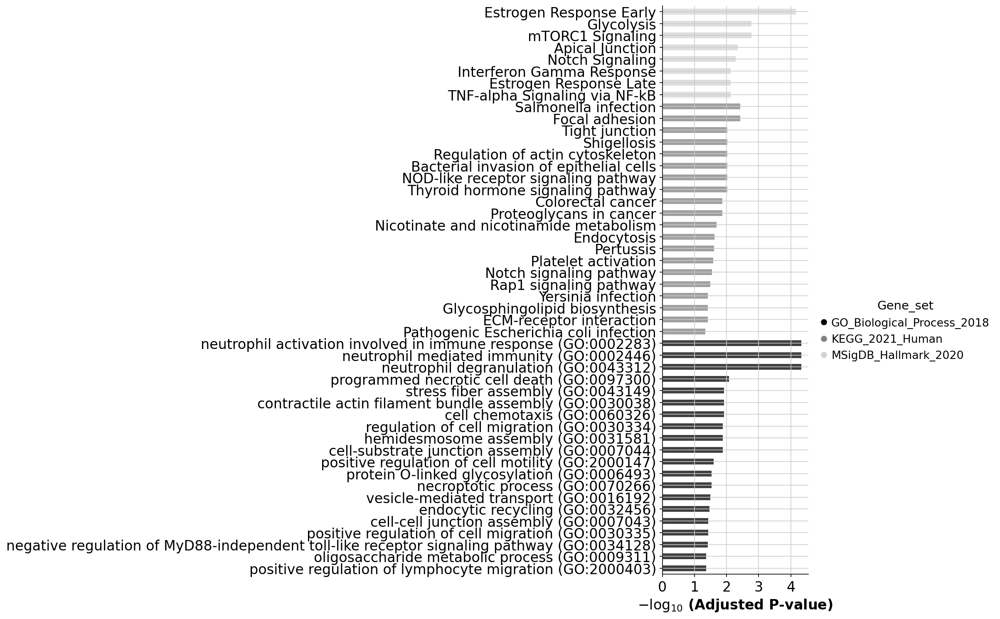

In [155]:
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=20,
              figsize=(3,12), 
              color=['black', 'grey','lightgrey'], # set colors for group
             )

In [156]:
sto = pd.DataFrame(sto, columns=['gene_list'])
duo = pd.DataFrame(duo, columns=['gene_list'])
ibd = pd.DataFrame(ibd, columns=['gene_list'])
ced = pd.DataFrame(ced, columns=['gene_list'])

sto.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/sto_SFmakers_downsampled.csv')
duo.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/duo_SFmakers_downsampled.csv')
ibd.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/ibd_SFmakers_downsampled.csv')
ced.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/marker_analysis/ced_SFmakers_downsampled.csv')

Try this code for gene overlap (in a separate notebook)
https://rdrr.io/bioc/GeneOverlap/man/GeneOverlap.html#:~:text=Given%20two%20gene%20lists%2C%20tests,estimated%20odds%20ratio%20and%20intersection

In [157]:
#look at intersect between stomach, duodenum and IBD SF cells
print("Genes common across all MUC5AC cells:", all_common)

Genes common across all MUC5AC cells: {'MPZL1', 'RPL19', 'TCF7L2', 'RPL12', 'UBE2N', 'SUCLG2', 'PRDX2', 'GTF3A', 'CLNS1A', 'GUCA2B', 'FABP2', 'HMGA1', 'RTN4', 'TNRC6B', 'HLA-E', 'RPL32', 'GNAS', 'KRCC1', 'MGAT4A', 'KIAA1324', 'PDGFA', 'MT-ND4', 'TMEM160', 'CGGBP1', 'MRPL3', 'GPA33', 'DYNLL2', 'DACH1', 'CAPN8', 'NDUFS4', 'UFC1', 'RASSF7', 'TXNL4A', 'SURF4', 'RPL18A', 'RPSA', 'SERP1', 'ITGA6', 'SPCS2', 'GMDS', 'SFT2D1', 'EID1', 'EIF4EBP1', 'ERP44', 'MT1E', 'RAB11FIP1', 'ARL6IP4', 'AMD1', 'RPS24', 'HLA-F', 'CLTC', 'XRCC5', 'PSMA1', 'RPL13', 'HLA-A', 'DYNC1LI2', 'TXN', 'ELF3', 'IMPDH2', 'HMGB3', 'RPL35A', 'C6orf62', 'NUDT22', 'MYADM', 'TRAM1', 'SUGT1', 'CNN3', 'TSPO', 'ARF1', 'MSRB2', 'CNPY2', 'KLF4', 'RPS27L', 'NCL', 'EDF1', 'TPT1', 'FKBP1A', 'PDLIM1', 'COX6C', 'CCNI', 'IDH3G', 'RANBP1', 'CDX1', 'CCDC47', 'PKP2', 'ARPC4', 'TPM3', 'TAPBP', 'UBL5', 'MIDN', 'HSBP1', 'TSC22D1', 'YIPF3', 'DECR1', 'MRPL13', 'CHCHD10', 'C1orf21', 'ZNF326', 'ADI1', 'MCL1', 'RPS3', 'RPL36', 'CYP2C18', 'POLR2I', 'R

In [164]:
print(type(gene_list))

<class 'list'>


In [165]:
print(type(all_common))

<class 'set'>


In [166]:
all_common = list(all_common)

In [167]:
print(type(all_common))

<class 'list'>


In [168]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=all_common, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2023'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

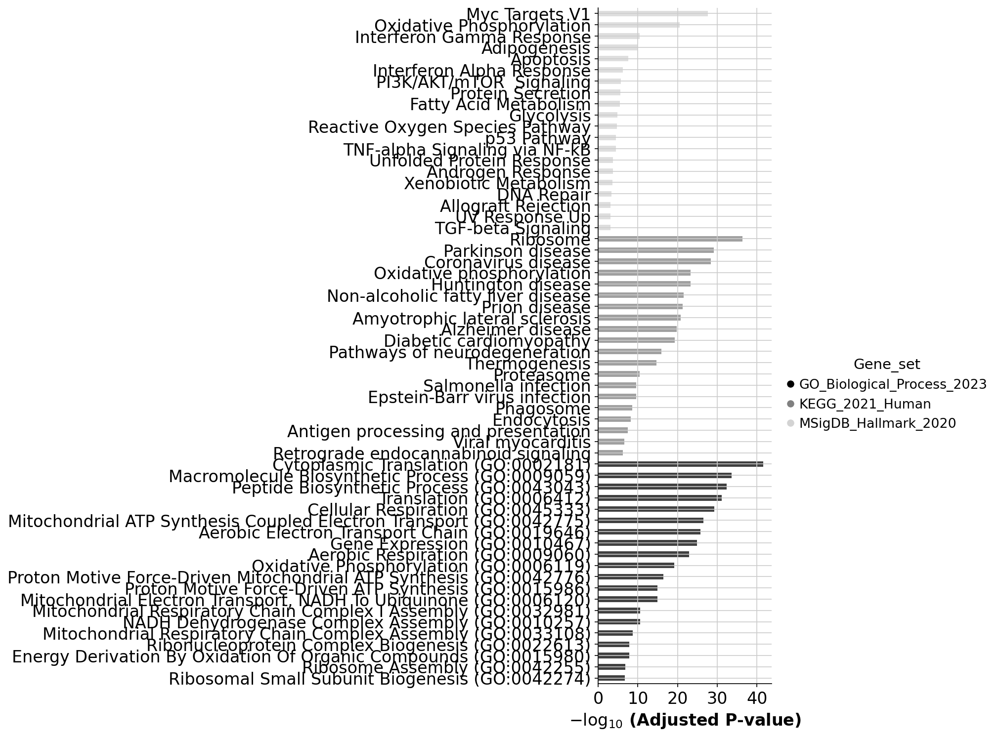

In [169]:
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=20,
              figsize=(3,12), 
              color=['black', 'grey','lightgrey'], # set colors for group
             )

In [170]:
ax.figure.savefig('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/figures/GSEA_commonmarkergenes_SFcells_sto_duo_ibd.pdf', bbox_inches='tight')

In [171]:
ibd

,gene_list
0,CEACAM5
1,IFI27
2,CEACAM7
3,CA2
4,PLAC8
...,...
2978,RPS19
2979,RPS6
2980,RPL13
2981,RPL17


In [176]:
genes_to_plot = list(ibd['gene_list'].head(50))

In [177]:
genes_to_plot

['CEACAM5',
 'IFI27',
 'CEACAM7',
 'CA2',
 'PLAC8',
 'MUC12',
 'SLC26A3',
 'TSPAN1',
 'S100A6',
 'PI3',
 'FXYD3',
 'MS4A12',
 'FABP1',
 'TMEM54',
 'CA1',
 'S100A10',
 'CEACAM6',
 'C15orf48',
 'C19orf33',
 'PHGR1',
 'LGALS3',
 'ETHE1',
 'PIGR',
 'CEACAM1',
 'RHOC',
 'MUC1',
 'LCN2',
 'S100P',
 'UGP2',
 'KRT20',
 'PKIB',
 'ASS1',
 'SMIM22',
 'TSPAN8',
 'ITM2C',
 'B2M',
 'SLPI',
 'SH3BGRL3',
 'CCL28',
 'CTSS',
 'MYL12B',
 'PLS1',
 'CSTB',
 'SULT1B1',
 'HIGD1A',
 'EMP1',
 'LINC01133',
 'GPT',
 'MISP',
 'PLA2G10']

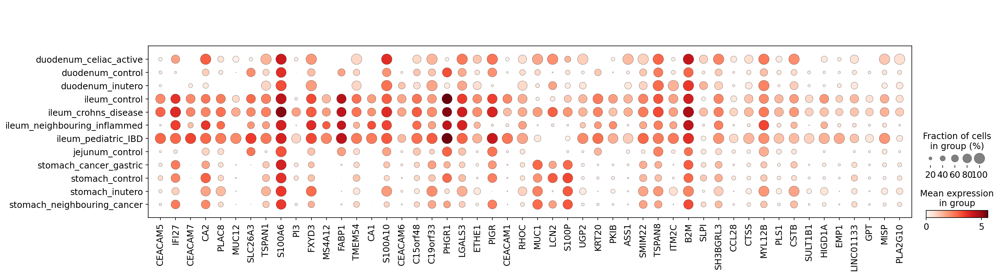

In [178]:
sc.pl.dotplot(plot_full_muc5, var_names=genes_to_plot,groupby='organ_disease')

In [182]:
m5_plot = plot_full_muc5[~plot_full_muc5.obs.organ_unified.isin(['jejunum'])].copy()

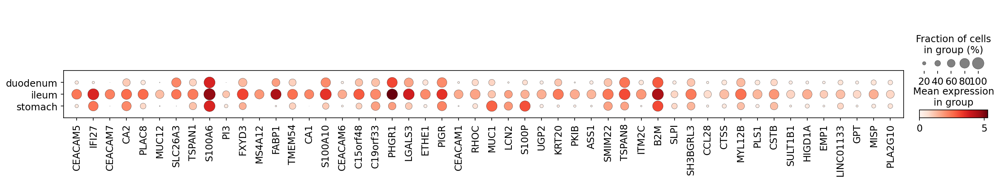

In [183]:
sc.pl.dotplot(m5_plot, var_names=genes_to_plot,groupby='organ_unified')

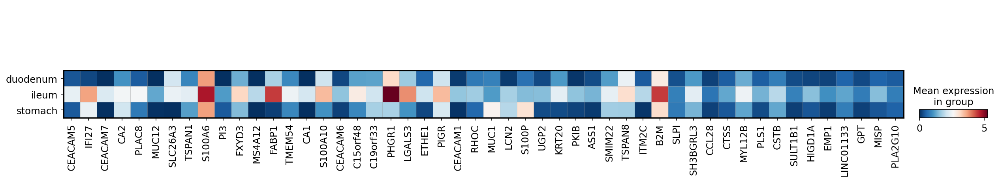

In [184]:
sc.pl.matrixplot(m5_plot, var_names=genes_to_plot,groupby='organ_unified',cmap='RdBu_r')

In [185]:
sc.tl.score_genes(m5_plot, genes_to_plot, ctrl_size=50, score_name='SFlike_score')

In [186]:
sc.tl.score_genes(plot_full_muc5, genes_to_plot, ctrl_size=50, score_name='SFlike_score')

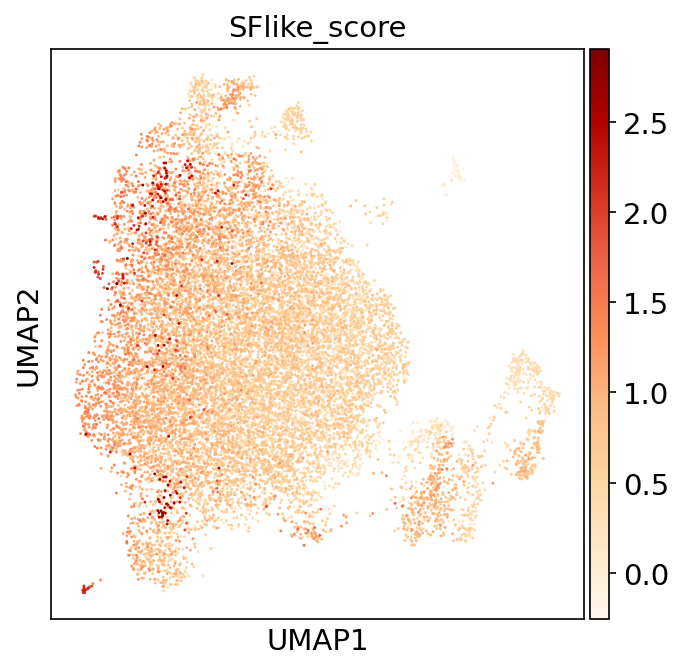

In [187]:
sc.pl.umap(plot_full_muc5,color='SFlike_score',cmap='OrRd')

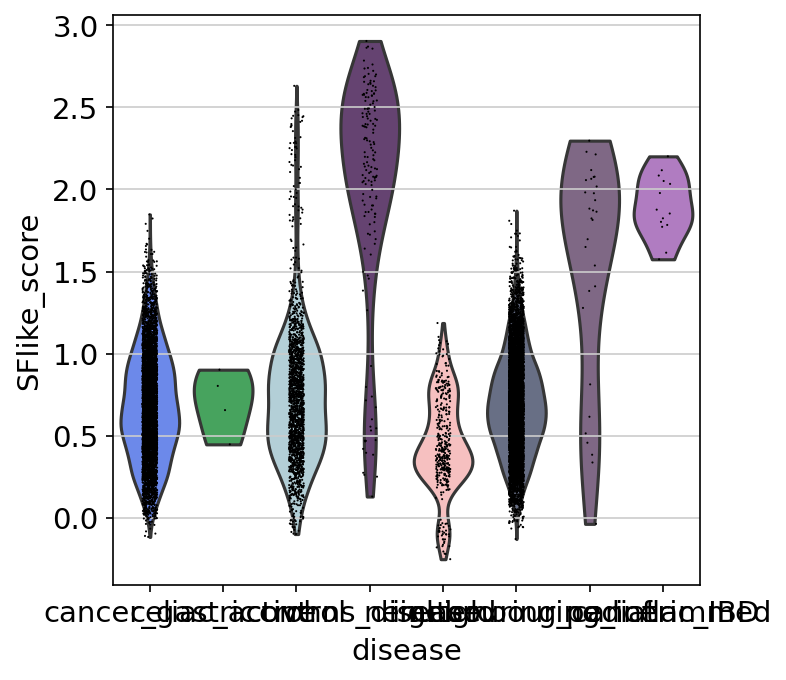

In [188]:
sc.pl.violin(plot_full_muc5,keys='SFlike_score',groupby='disease')

In [189]:
genes_to_plot = list(duo['gene_list'].head(50))

In [191]:
genes_to_plot

['MT-ATP8',
 'MT-ND4L',
 'SLC26A3',
 'CTSE',
 'ANXA10',
 'MT-ND6',
 'TFF2',
 'GCNT3',
 'CA2',
 'HPGD',
 'LYZ',
 'TFF1',
 'FOLH1',
 'CAPN8',
 'AKR1B10',
 'ONECUT2',
 'MUC3A',
 'AKR1C2',
 'SULT1C2',
 'MTRNR2L12',
 'TMPRSS15',
 'MSMB',
 'GOLM1',
 'SLC4A7',
 'PSCA',
 'TM4SF20',
 'MT-ND5',
 'HSPB1',
 'AHNAK',
 'C6orf141',
 'VSIG2',
 'CYP2C18',
 'MT-CO2',
 'ABCC3',
 'MLPH',
 'SLC25A37',
 'TSPAN8',
 'AKR1C1',
 'ANPEP',
 'AL627171.2',
 'CES2',
 'SGK1',
 'CYSTM1',
 'SLC4A4',
 'AK4',
 'SERPINB6',
 'GPRC5A',
 'RGS2',
 'HSD17B2',
 'REG4']

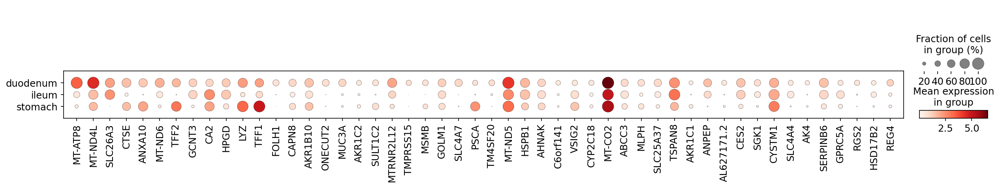

In [190]:
sc.pl.dotplot(m5_plot, var_names=genes_to_plot,groupby='organ_unified')

In [192]:
#generate gene lists
sc.tl.rank_genes_groups(stomach,groupby='level_3_annot',method='wilcoxon')
sto_up = sc.get.rank_genes_groups_df(stomach, group='Surface_foveolar',  
                                    pval_cutoff=0.05,log2fc_min=0)['names'].squeeze().str.strip().tolist()
print(len(sto_up))
#generate gene lists
sc.tl.rank_genes_groups(duodenum,groupby='level_3_annot',method='wilcoxon')
duo_up = sc.get.rank_genes_groups_df(duodenum, group='Surface_foveolar',  
                                    pval_cutoff=0.05,log2fc_min=0)['names'].squeeze().str.strip().tolist()
print(len(duo_up))
#generate gene lists
sc.tl.rank_genes_groups(IBD,groupby='level_3_annot',method='wilcoxon')
ibd_up = sc.get.rank_genes_groups_df(IBD, group='Surface_foveolar',  
                                    pval_cutoff=0.05,log2fc_min=0)['names'].squeeze().str.strip().tolist()
print(len(ibd_up))

408
56
2705


In [193]:
#make overlapping gene lists

set1_up = set(sto_up)
set2_up = set(duo_up)
set3_up = set(ibd_up)

sto_vs_ibd_up = set1_up.intersection(set3_up)
print("Overlapping genes:", sto_vs_ibd_up)

all_common_up = set(sto_vs_ibd_up).intersection(set2_up)
print("Genes commonly upregulated across all MUC5AC cells:", all_common_up)

Overlapping genes: {'SEC61G', 'INF2', 'PLAUR', 'AXDND1', 'ARL14', 'TFCP2L1', 'RHBDL2', 'BAD', 'GSN', 'TMSB4X', 'MAL2', 'VSIG2', 'ROMO1', 'MCU', 'SLC16A1', 'CXCL3', 'TNFRSF21', 'PIP4K2C', 'ERN2', 'SLC9A1', 'UBL3', 'CHP1', 'RNF145', 'CAPN8', 'HSPG2', 'GDPD3', 'VILL', 'S100A16', 'MRPL52', 'C6orf132', 'RSU1', 'NOP10', 'JAG1', 'HLA-DMA', 'GPRC5A', 'SDCBP', 'FXYD3', 'TMBIM1', 'PFN1', 'TSPAN1', 'B4GALNT3', 'MECOM', 'RHOF', 'MPZL2', 'LAMA3', 'POLR2L', 'BLVRB', 'C19orf33', 'ABLIM1', 'RAB11A', 'PHACTR2', 'ARF6', 'OSBPL7', 'TSPO', 'S100P', 'DUOX2', 'MYEOV', 'AHNAK', 'MYL12A', 'TMEM63B', 'ARL6IP1', 'TAX1BP3', 'AKR7A3', 'SFN', 'PRDX1', 'EFNB2', 'BIK', 'GOLM1', 'B4GALT1', 'APOL1', 'GALE', 'LINC01133', 'SLC44A4', 'MGST3', 'CYP2C18', 'H2AFJ', 'B3GNT7', 'MUC1', 'HYAL1', 'PPARG', 'HSPB1', 'PLXNB2', 'IGSF9', 'ABCC3', 'HPGD', 'GIPC1', 'ETNK1', 'FA2H', 'MTRNR2L8', 'GPX2', 'UGCG', 'IER3', 'RAB32', 'CYSTM1', 'CACFD1', 'ARPC1A', 'SDR16C5', 'LCN2', 'NQO1', 'DUOXA2', 'PLCD3', 'SH3BGRL2', 'C12orf75', 'YWHAH', 'T

In [218]:
sto_vs_duo_up = set1_up.intersection(set2_up)
print("Overlapping genes:", sto_vs_duo_up)

Overlapping genes: {'TFF2', 'ABCC3', 'HPGD', 'CA2', 'FOXQ1', 'SULT1C2', 'VSIG2', 'AKR1B10', 'OSBPL7', 'MSMB', 'AHNAK', 'CAPN8', 'TRIM31', 'TFF1', 'GOLM1', 'PLA2G10', 'C6orf141', 'ANXA10', 'AKR1C1', 'GPRC5A', 'CYP2C18', 'TM4SF1', 'CTSE', 'AKR1C2', 'MLPH', 'NDUFA7', 'GALNT6', 'HSPB1'}


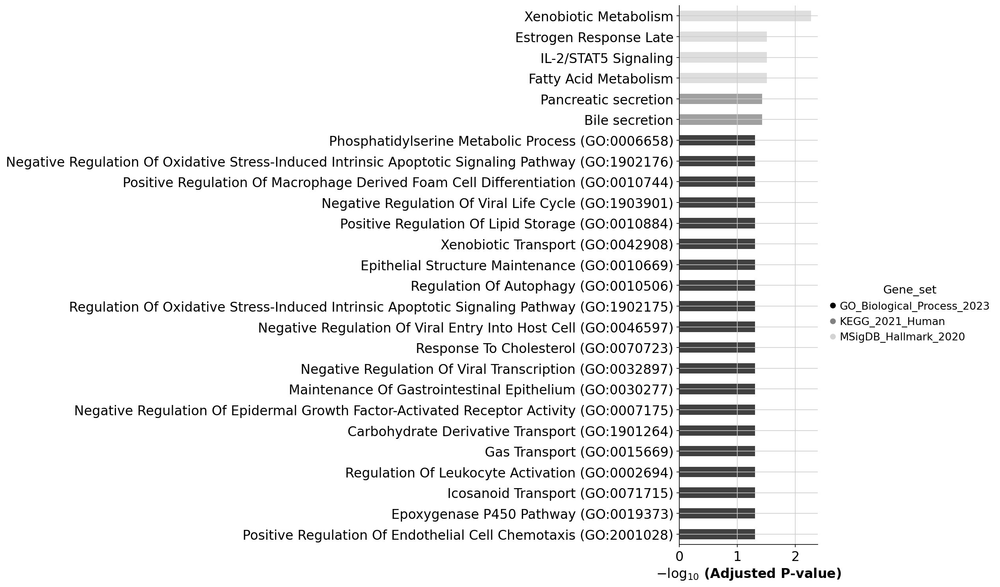

In [245]:
all_common_up = list(all_common_up)
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=all_common_up, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2023'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=20,
              figsize=(3,12), 
              color=['black', 'grey','lightgrey'], # set colors for group
             )
ax.figure.savefig('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/figures/GSEA_commonmarkergenes_SFcells_sto_duo_ibd_upregulatedgenesets.pdf', bbox_inches='tight')

In [246]:
enr.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Xenobiotic Metabolism,3/200,0.000410,0.005332,0,0,25.111675,195.844021,ABCC3;CA2;CYP2C18
1,MSigDB_Hallmark_2020,Fatty Acid Metabolism,2/158,0.006087,0.031168,0,0,19.555227,99.764276,HPGD;CA2
2,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,2/199,0.009498,0.031168,0,0,15.453339,71.960819,AHNAK;CA2
3,MSigDB_Hallmark_2020,Estrogen Response Late,2/200,0.009590,0.031168,0,0,15.374514,71.445883,CA2;TFF1
4,MSigDB_Hallmark_2020,Apical Surface,1/44,0.032508,0.084520,0,0,33.126246,113.499815,HSPB1
5,MSigDB_Hallmark_2020,Androgen Response,1/100,0.072455,0.139987,0,0,14.347763,37.659814,HPGD
6,MSigDB_Hallmark_2020,UV Response Up,1/158,0.112203,0.139987,0,0,9.020928,19.732801,CA2
7,MSigDB_Hallmark_2020,Apoptosis,1/161,0.114215,0.139987,0,0,8.850446,19.202581,HSPB1
8,MSigDB_Hallmark_2020,heme Metabolism,1/200,0.139987,0.139987,0,0,7.101938,13.963876,CA2
9,MSigDB_Hallmark_2020,Estrogen Response Early,1/200,0.139987,0.139987,0,0,7.101938,13.963876,TFF1


In [247]:
sig_results = enr.results[enr.results['Adjusted P-value']<0.05]

In [195]:
all_common_up

['VSIG2',
 'ABCC3',
 'CYP2C18',
 'TRIM31',
 'HPGD',
 'CA2',
 'AKR1B10',
 'OSBPL7',
 'TFF1',
 'GOLM1',
 'PLA2G10',
 'AHNAK',
 'CAPN8',
 'GPRC5A',
 'HSPB1']

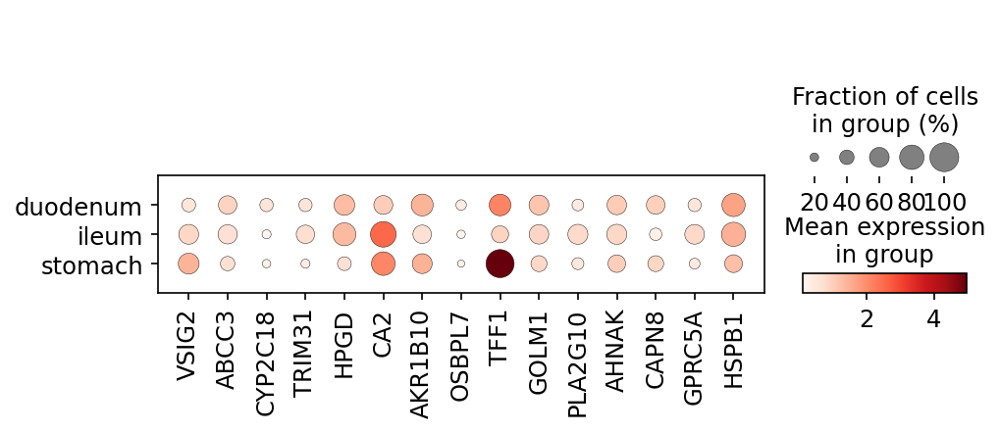

In [202]:
sc.pl.dotplot(m5_plot, var_names=all_common_up,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes.pdf')

In [213]:
genes = {'upregulated_duoandIBD':['HSD17B2',
'SERPINB6',
'MALL',
'SGK1',
'MT-CO2',
'SLC26A3',
'GCNT3',
'MT-ND5',
'CDHR2',
'SLC25A37',
'SLC4A4',
'MTRNR2L12',
'IQGAP2'],
'upregulated_all':['VSIG2',
 'ABCC3',
 'CYP2C18',
 'TRIM31',
 'HPGD',
 'CA2',
 'AKR1B10',
 'OSBPL7',
 'TFF1',
 'GOLM1',
 'PLA2G10',
 'AHNAK',
 'CAPN8',
 'GPRC5A',
 'HSPB1']}

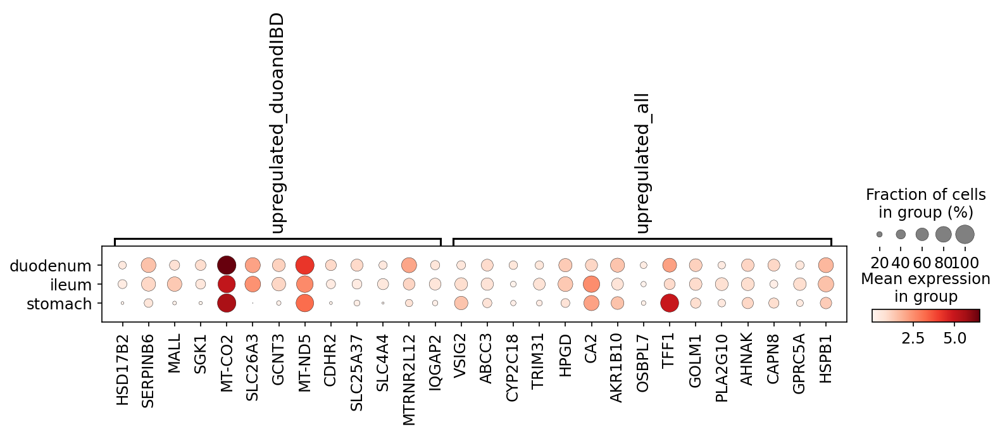

In [214]:
sc.pl.dotplot(m5_plot, var_names=genes,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBD.pdf')

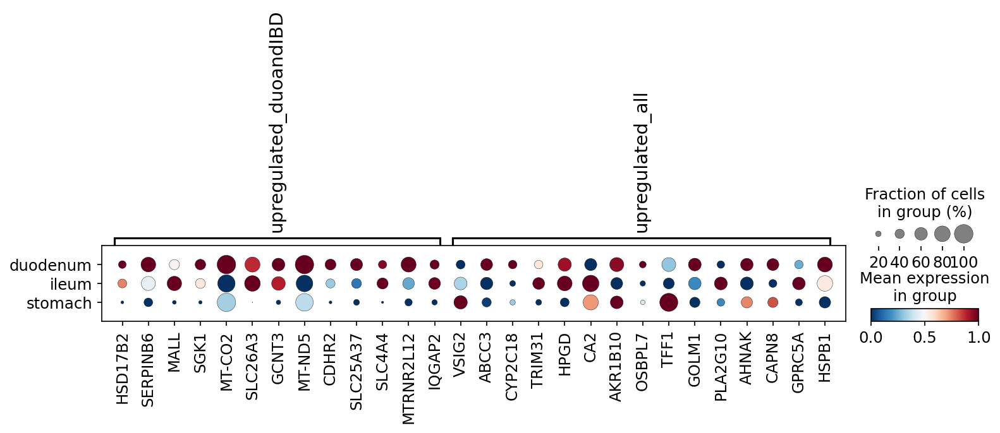

In [215]:
sc.pl.dotplot(m5_plot, var_names=genes,groupby='organ_unified',cmap='RdBu_r',standard_scale='var',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBD_cmap.pdf')

In [226]:
genes = {'upregulated_all':['VSIG2',
 'ABCC3',
 'CYP2C18',
 'TRIM31',
 'HPGD',
 'CA2',
 'AKR1B10',
 'OSBPL7',
 'TFF1',
 'GOLM1',
 'PLA2G10',
 'AHNAK',
 'CAPN8',
 'GPRC5A',
 'HSPB1'],
    'upregulated_duoandIBD':['HSD17B2',
'SERPINB6',
'MALL',
'SGK1',
'MT-CO2',
'SLC26A3',
'GCNT3',
'MT-ND5',
'CDHR2',
'SLC25A37',
'SLC4A4',
'MTRNR2L12',
'IQGAP2'],
         'upregulated_stoandIBD':['SEC61G', 'INF2', 'PLAUR', 'AXDND1', 'ARL14', 'TFCP2L1', 'RHBDL2', 'BAD', 'GSN', 
                                  'TMSB4X', 'MAL2', 'VSIG2', 'ROMO1', 'MCU', 'SLC16A1', 'CXCL3', 'TNFRSF21', 'PIP4K2C', 
                                  'ERN2', 'SLC9A1', 'UBL3', 'CHP1', 'RNF145', 'CAPN8', 'HSPG2', 'GDPD3', 'VILL', 'S100A16', 
                                  'MRPL52', 'C6orf132', 'RSU1', 'NOP10', 'JAG1', 'HLA-DMA', 'GPRC5A', 'SDCBP', 'FXYD3', 
                                  'TMBIM1', 'PFN1', 'TSPAN1', 'B4GALNT3', 'MECOM', 'RHOF', 'MPZL2', 'LAMA3', 'POLR2L',
                                  'BLVRB', 'C19orf33', 'ABLIM1', 'RAB11A', 'PHACTR2', 'ARF6', 'OSBPL7', 'TSPO', 'S100P',
                                  'DUOX2', 'MYEOV', 'AHNAK', 'MYL12A', 'TMEM63B', 'ARL6IP1', 'TAX1BP3', 'AKR7A3', 'SFN',
                                  'PRDX1', 'EFNB2', 'BIK', 'GOLM1', 'B4GALT1', 'APOL1', 'GALE', 'LINC01133', 'SLC44A4',
                                  'MGST3', 'CYP2C18', 'H2AFJ', 'B3GNT7', 'MUC1', 'HYAL1', 'PPARG', 'HSPB1', 'PLXNB2',
                                  'IGSF9', 'ABCC3', 'HPGD', 'GIPC1', 'ETNK1', 'FA2H', 'MTRNR2L8', 'GPX2', 'UGCG', 'IER3',
                                  'RAB32', 'CYSTM1', 'CACFD1', 'ARPC1A', 'SDR16C5', 'LCN2', 'NQO1', 'DUOXA2', 'PLCD3', 
                                  'SH3BGRL2', 'C12orf75', 'YWHAH', 'TRIM47', 'SDCBP2', 'LGALS9', 'LPCAT4', 'AKR1C3', 
                                  'UGDH', 'LAMB3', 'SYTL2', 'ITGB4', 'SPINK5', 'RAP2B', 'CD59', 'LDHD', 'TRIM31',
                                  'CLDN23', 'HLA-DPB1', 'CAPG', 'DHCR24', 'ADAM9', 'PLA2G10', 'PKP3', 'ALDH3A2', 
                                  'SIRT7', 'ZBTB7C', 'TAGLN2', 'PI3', 'SDC4', 'PTK6', 'TIMM8B', 'CLIC1', 'TIMP1', 
                                  'CHURC1', 'ADAM15', 'SLC44A2', 'S100A11', 'IFI27', 'SMIM5', 'FABP5', 
                                  'SLC9A2', 'ISG20', 'CA2', 'SLPI', 'PCSK7', 'ELOVL6', 'SLC6A14', 'TTLL12', 
                                  'AK1', 'FHL2', 'EPS8L1', 'DDX60', 'OASL', 'CXCL1', 'KRT19', 'AKR1B10', 
                                  'PDZK1IP1', 'ABHD2', 'MRPL14', 'PET100', 'GSTP1', 'HK1', 'IL1RN', 'SAT1',
                                  'LIPH', 'TFF1', 'RNASE1', 'SMIM22', 'S100A6', 'CSTB', 'FUT2', 'PDIA4',
                                  'ATP2A3', 'PLAC8', 'CYBA', 'MST1R', 'MUC4', 'KLF2'],
}

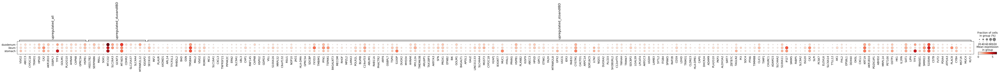

In [227]:
sc.pl.dotplot(m5_plot, var_names=genes,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBDandstoIBD.pdf')

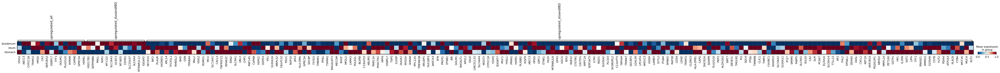

In [228]:
sc.pl.matrixplot(m5_plot, var_names=genes,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBDandstoIBD.pdf',cmap='RdBu_r',standard_scale='var')

In [241]:
genes = {'classic markers':['MUC5AC'],'upregulated_all':['VSIG2',
 'ABCC3',
 'CYP2C18',
 'TRIM31',
 'HPGD',
 'CA2',
 'AKR1B10',
 'OSBPL7',
 'TFF1',
 'GOLM1',
 'PLA2G10',
 'AHNAK',
 'CAPN8',
 'GPRC5A',
 'HSPB1'],
    'upregulated_duoandIBD':['HSD17B2',
'SERPINB6',
'MALL',
'SGK1',
'MT-CO2',
'SLC26A3',
'GCNT3',
'MT-ND5',
'CDHR2',
'SLC25A37',
'SLC4A4',
'MTRNR2L12',
'IQGAP2'],
         'selected_upregulated_stoandIBD':['CXCL3', 'TNFRSF21',  'HLA-DMA', 
                                  'DUOX2', 
                                   'MUC1','LCN2', 'DUOXA2', 
                                   'HLA-DPB1', 'IFI27',  'SLPI', 'CXCL1', 'TFF1', 'MUC4'],
}

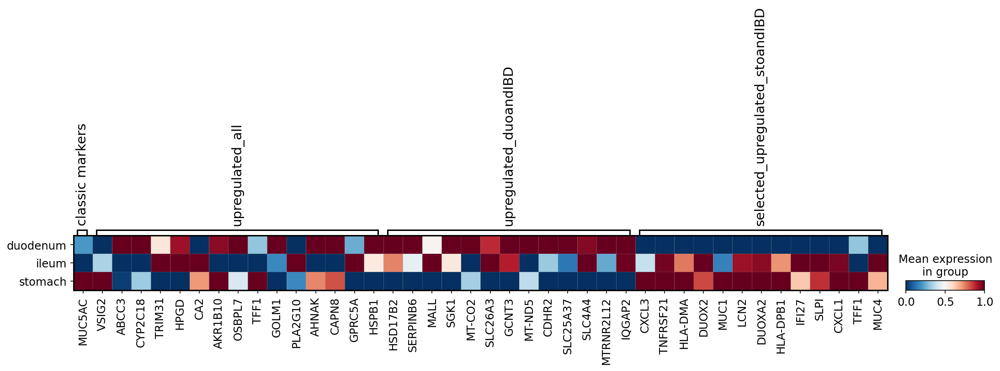

In [242]:
#Overlapping marker genes in SF/SF-like cells across organ/disease - Extended data 6f
sc.pl.matrixplot(m5_plot, var_names=genes,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBDandstoIBD_selected.pdf',cmap='RdBu_r',standard_scale='var')

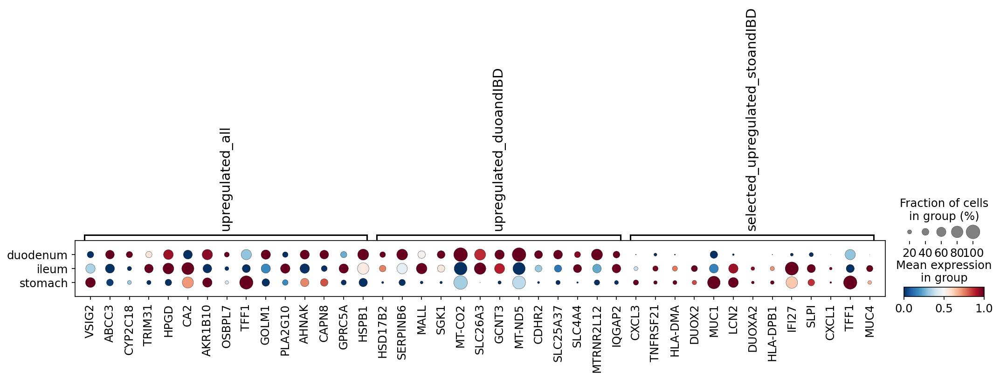

In [233]:
sc.pl.dotplot(m5_plot, var_names=genes,groupby='organ_unified',save='SFcells_across_organs_commonlyupregulatedgenes_allandduoIBDandstoIBD_selected.pdf',cmap='RdBu_r',standard_scale='var')

In [197]:
duo_vs_ibd_up = set2_up.intersection(set3_up)

In [198]:
duo_vs_ibd_up

{'ABCC3',
 'AHNAK',
 'AKR1B10',
 'CA2',
 'CAPN8',
 'CDHR2',
 'CYP2C18',
 'GCNT3',
 'GOLM1',
 'GPRC5A',
 'HPGD',
 'HSD17B2',
 'HSPB1',
 'IQGAP2',
 'MALL',
 'MT-CO2',
 'MT-ND5',
 'MTRNR2L12',
 'OSBPL7',
 'PLA2G10',
 'SERPINB6',
 'SGK1',
 'SLC25A37',
 'SLC26A3',
 'SLC4A4',
 'TFF1',
 'TRIM31',
 'VSIG2'}

In [200]:
duo_vs_ibd_up = list(duo_vs_ibd_up)

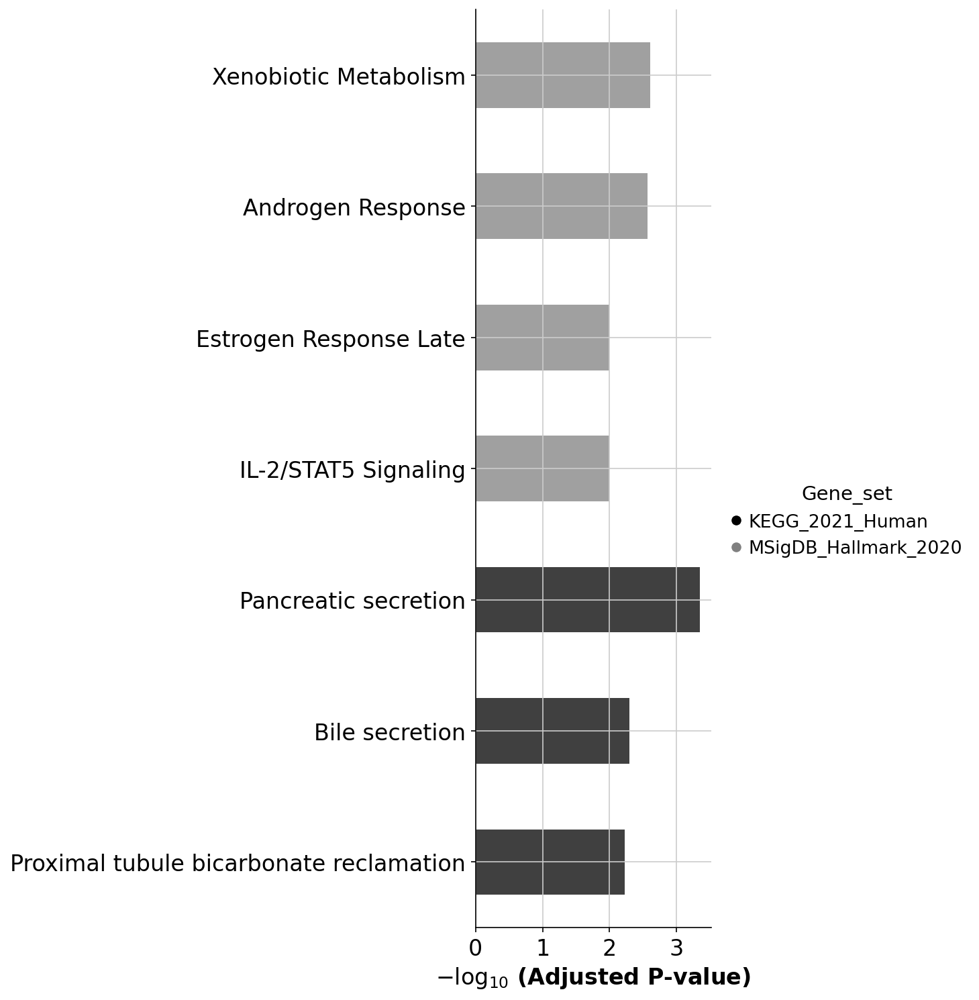

In [204]:
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=duo_vs_ibd_up, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2023'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=20,
              figsize=(3,12), 
              color=['black', 'grey','lightgrey'], # set colors for group
             )
ax.figure.savefig('/nfs/team205/ao15/Megagut/Annotations_v3/disease_analysis/Surface_foveolar_analysis/figures/GSEA_commonmarkergenes_SFcells_duo_ibd_upregulatedgenesets.pdf', bbox_inches='tight')

In [205]:
enr.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Xenobiotic Metabolism,4/200,0.000165,0.002469,0,0,16.816327,146.502780,ABCC3;CA2;HSD17B2;CYP2C18
1,MSigDB_Hallmark_2020,Androgen Response,3/100,0.000363,0.002721,0,0,24.587629,194.773359,HPGD;SGK1;IQGAP2
2,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,3/199,0.002646,0.010065,0,0,12.107755,71.854803,AHNAK;CA2;SERPINB6
3,MSigDB_Hallmark_2020,Estrogen Response Late,3/200,0.002684,0.010065,0,0,12.045685,71.315632,CA2;TFF1;SGK1
4,MSigDB_Hallmark_2020,Fatty Acid Metabolism,2/158,0.020492,0.059471,0,0,9.771203,37.987580,HPGD;CA2
5,MSigDB_Hallmark_2020,heme Metabolism,2/200,0.031718,0.059471,0,0,7.682207,26.510280,SLC25A37;CA2
6,MSigDB_Hallmark_2020,KRAS Signaling Up,2/200,0.031718,0.059471,0,0,7.682207,26.510280,CA2;MALL
7,MSigDB_Hallmark_2020,KRAS Signaling Dn,2/200,0.031718,0.059471,0,0,7.682207,26.510280,AKR1B10;SGK1
8,MSigDB_Hallmark_2020,Apical Surface,1/44,0.059844,0.099740,0,0,17.165375,48.337982,HSPB1
9,MSigDB_Hallmark_2020,UV Response Up,1/158,0.199268,0.245424,0,0,4.674452,7.540389,CA2


In [206]:
sig_results = enr.results[enr.results['Adjusted P-value']<0.05]

In [207]:
sig_results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Xenobiotic Metabolism,4/200,0.000165,0.002469,0,0,16.816327,146.502780,ABCC3;CA2;HSD17B2;CYP2C18
1,MSigDB_Hallmark_2020,Androgen Response,3/100,0.000363,0.002721,0,0,24.587629,194.773359,HPGD;SGK1;IQGAP2
2,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,3/199,0.002646,0.010065,0,0,12.107755,71.854803,AHNAK;CA2;SERPINB6
3,MSigDB_Hallmark_2020,Estrogen Response Late,3/200,0.002684,0.010065,0,0,12.045685,71.315632,CA2;TFF1;SGK1
15,KEGG_2021_Human,Pancreatic secretion,4/102,0.000012,0.000452,0,0,33.799320,383.301831,CA2;PLA2G10;SLC26A3;SLC4A4
16,KEGG_2021_Human,Bile secretion,3/90,0.000266,0.005056,0,0,27.427586,225.776110,ABCC3;CA2;SLC4A4
17,KEGG_2021_Human,Proximal tubule bicarbonate reclamation,2/23,0.000470,0.005948,0,0,73.080586,560.069110,CA2;SLC4A4


In [223]:
len(ibd_up)

2705

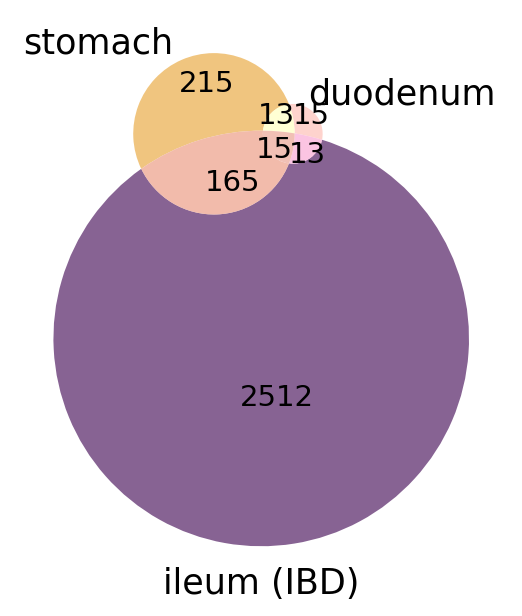

In [221]:
#plot overlapping upregulated marker genes - Extended data 6e
from matplotlib_venn import venn3
set1 = set(sto_up)
set2 = set(duo_up)
set3 = set(ibd_up)

venn3([set1, set2, set3], ('stomach', 'duodenum', 'ileum (IBD)'),set_colors=('#edb75f', '#fec8c1','#693C78'), alpha = 0.8)
plt.savefig('venn_MUC5_markers_upregulated.pdf')

plt.show()